# Explore differential expression analysis results

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
from joblib import Parallel, delayed
import time
import sys
from tqdm import tqdm

import matplotlib.pyplot as plt
import seaborn as sns

import hdbscan
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from scipy.sparse import csr_matrix
from scipy.stats import hypergeom

import matplotlib.cm as cm
import matplotlib.colors as mcolors
import time

sys.path.append('../3_DE_analysis/')
from DE_analysis_utils import *

pd.set_option('display.max_rows', 200)
sc.set_figure_params(figsize=(20, 4))

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/scanpy/readwrite.py:16: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):


In [2]:
datadir = '/Users/rzhu/Gladstone Dropbox/Ronghui Zhu/GRNPerturbSeq/3_expts/processed_data/CD4i_final'
experiment_name = 'CD4i_final'

## Read best DE results, filter based on number of DE genes and on-target KD effects

In [23]:
adata_de = sc.read_h5ad(datadir + f'/DE_results_all_confounders/{experiment_name}.merged_DE_results_corrected.h5ad')

In [24]:
adata_de.layers['zscore'] = adata_de.layers['log_fc'] / adata_de.layers['lfcSE']
adata_de.layers['zscore'][np.where(adata_de.layers['zscore'] > 50)] = 50
adata_de.X = np.nan_to_num(adata_de.layers['zscore'], 0)
adata_de.layers['masked_zscore'] = adata_de.layers['zscore'].copy()
for gene_id in (set(adata_de.obs.target_contrast_corrected.unique()))&(set(adata_de.var.gene_ids)):
    adata_de.layers['masked_zscore'][adata_de.obs.target_contrast_corrected==gene_id, adata_de.var.gene_ids==gene_id] = 0

In [11]:
# adata_de.write_h5ad(datadir + f'/DE_results_all_confounders/{experiment_name}.merged_DE_results_corrected.h5ad')

In [5]:
de_summary_stats = pd.read_csv(datadir + f'/DE_results_all_confounders/DE_summary_stats_per_target_corrected.csv', index_col=0)

In [6]:
# Perturbation selection
mask = (de_summary_stats.n_total_de_genes>50) & (de_summary_stats.n_cells_target>50)
obs_names_mask = de_summary_stats[mask].obs_names
adata_de_filtered = adata_de[adata_de.obs_names.isin(obs_names_mask)].to_memory().copy()
adata_de_filtered.var_names = adata_de_filtered.var.gene_name
adata_de_filtered.X = np.nan_to_num(adata_de_filtered.layers['masked_zscore'], 0).copy()

In [7]:
adata_de_filtered

AnnData object with n_obs × n_vars = 3964 × 13959
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target', 'target_contrast_corrected', 'target_contrast_gene_name_corrected'
    var: 'gene_ids', 'gene_name'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'masked_zscore', 'p_value', 'zscore'

In [7]:
# # Select features with variance in the top 50% and/or top differentially expressed genes for all perturbations ordered by zscores that are significant
# zscore = adata_de_filtered.layers['masked_zscore']
# padj = adata_de_filtered.layers['adj_p_value']
# zscore = zscore*(padj<0.1)
# zscore_ranking = np.argsort(zscore, axis=1)
# top_mask = np.sum(((zscore_ranking>(np.max(zscore_ranking)-200))*(zscore>0))|((zscore_ranking<200)*(zscore<0)), axis=0)>0
# var_mask = adata_de_filtered.X.var(axis=0)>np.percentile(adata_de_filtered.X.var(axis=0), 50)
# adata_de_filtered = adata_de_filtered[:,top_mask|var_mask].copy()

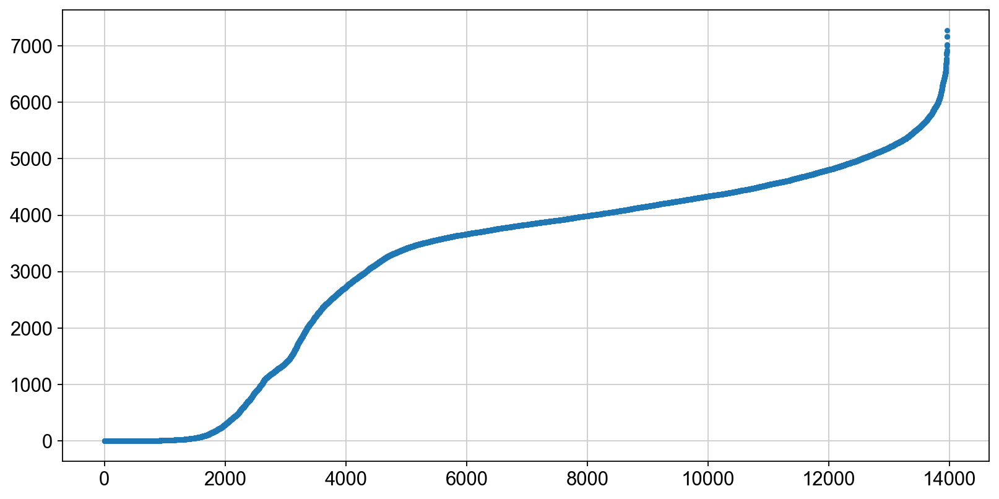

In [8]:
fig, ax = plt.subplots(figsize=(12,6))
plt.plot(np.sort(np.abs(adata_de_filtered.X).sum(0)), '.')

In [9]:
adata_de_filtered = adata_de_filtered[:,np.abs(adata_de_filtered.X).sum(0)>1500].copy()

In [10]:
adata_de_filtered

AnnData object with n_obs × n_vars = 3964 × 10864
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target', 'target_contrast_corrected', 'target_contrast_gene_name_corrected'
    var: 'gene_ids', 'gene_name'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'masked_zscore', 'p_value', 'zscore'

In [11]:
adata_de_filtered.write_h5ad('../../../../3_expts/processed_data/analysis_largefiles/adata_de_nde50ntotal50_varfiltered_simple.h5ad')

In [13]:
adata_cluster = sc.read_h5ad('../../../../3_expts/processed_data/analysis_largefiles/adata_de_nde50ntotal50_varfiltered_simple.h5ad')

### Simple PCA clustering

In [11]:
sc.pp.scale(adata_cluster)

In [18]:
sc.pp.pca(adata_cluster, n_comps=300)

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/scanpy/preprocessing/_pca/__init__.py:245: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  Version(ad.__version__) < Version("0.9")


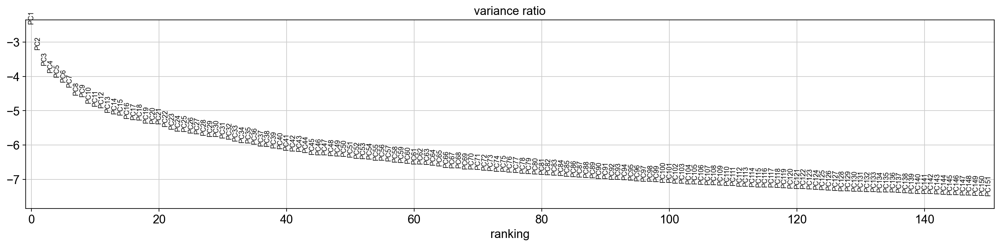

In [19]:
sc.pl.pca_variance_ratio(adata_cluster, n_pcs=150, log=True)

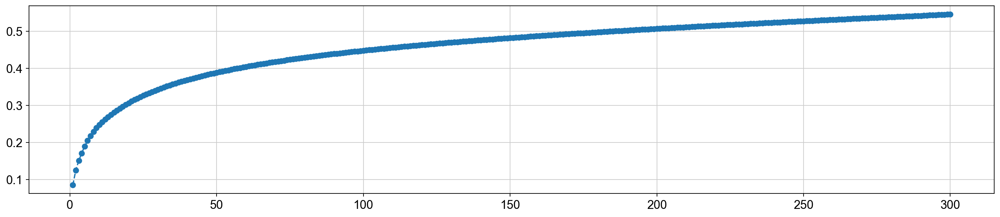

In [20]:
variance_ratio = adata_cluster.uns['pca']['variance_ratio']
cumulative_variance_ratio = np.cumsum(variance_ratio)
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o', linestyle='--')

In [3]:
adata_cluster = sc.read_h5ad('../../../../3_expts/processed_data/analysis_largefiles/adata_de_nde50ntotal50_varfiltered_simple.h5ad')

In [4]:
def generate_masks(data_length: int, percentage: float, num_times: int, random_seed=42) -> List[List[bool]]:
    np.random.seed(random_seed)
    sample_size = int(data_length * (percentage / 100.0))
    masks = []
    for _ in range(num_times):
        indices = np.random.choice(data_length, size=sample_size, replace=False)
        mask = np.zeros(data_length, dtype=bool)
        mask[indices] = True
        masks.append(mask)
    return masks


def running_clustering(obs_mask, var_mask, n_comp_all=[50,100,150], n_neighbor_all=[15,31,63], resolution_all=[2,3,4]):
    """
    Running leiden clustering with parameter grid
    """
    N = len(adata_cluster)
    # Subsetting the adata
    adata_tmp = adata_cluster[obs_mask, var_mask].copy()
    # Perform PCA
    sc.pp.scale(adata_tmp)
    sc.pp.pca(adata_tmp, n_comps=max(n_comp_all))
    clustering_batch = []
    for n_comp in n_comp_all:
        for n_neighbor in n_neighbor_all:
            # Perform knn
            sc.pp.neighbors(adata_tmp, n_pcs=n_comp, n_neighbors=n_neighbor, random_state=42)
            for resolution in resolution_all:
                # Perform leiden
                sc.tl.leiden(adata_tmp, resolution=resolution, random_state=42)
                adata_tmp.obs['leiden'] = adata_tmp.obs['leiden'].astype(int)
                adata_tmp.obs['leiden'] = adata_tmp.obs['leiden'].astype('category')
                cluster_labels_numerical = adata_tmp.obs['leiden'].cat.codes
                clustering_tmp = np.full(N, np.nan)
                clustering_tmp[obs_mask] = cluster_labels_numerical
                clustering_batch.append({'n_comp':n_comp,
                                         'n_neighbor':n_neighbor,
                                         'resolution':resolution,
                                         'leiden_assignment': clustering_tmp,
                                         'obs_mask': obs_mask,
                                         'var_mask': var_mask})
    return clustering_batch

In [5]:
N = adata_cluster.shape[0]
M = adata_cluster.shape[1]
num_of_repeat = 200
obs_perc = 70
var_perc = 70
obs_mask_full = [np.full(N, True)] * num_of_repeat
obs_mask_bs = generate_masks(N, obs_perc, num_of_repeat, 42)
var_mask_full = [np.full(M, True)] * num_of_repeat
var_mask_bs = generate_masks(M, var_perc, num_of_repeat, 7)
mask_all = pd.DataFrame({'obs_mask': obs_mask_full+obs_mask_bs,
                         'var_mask': var_mask_bs+var_mask_full})

In [6]:
start_time = time.time()
def run_one_clustering(row):
    return running_clustering(row.obs_mask, row.var_mask)

# Run in parallel
clustering_all = Parallel(n_jobs=-1, backend="loky")(
    delayed(run_one_clustering)(row) for _, row in tqdm(mask_all.iterrows(), total=len(mask_all))
)

clustering_all = [item for sublist in clustering_all for item in sublist]
end_time = time.time()
print(end_time-start_time)

  4%|████▊                                                                                                                  | 16/400 [00:00<00:05, 73.05it/s]/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/scanpy/_utils/__init__.py:33: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/scanpy/readwrite.py:16: FutureWarning: `__version__`

2215.7441260814667


In [7]:
clustering_summary = pd.DataFrame(clustering_all)
clustering_summary.to_parquet('../../../../3_expts/processed_data/analysis_largefiles/pca_params_screening_nde50ntotal50_varfiltered_simple_neighbor1563resolution24.parquet')

In [8]:
clustering_summary = pd.read_parquet('../../../../3_expts/processed_data/analysis_largefiles/pca_params_screening_nde50ntotal50_varfiltered_simple_neighbor1563resolution24.parquet')

### Build consensus matrix

In [9]:
# Summing all clustering results
n_cells = len(clustering_summary.loc[0, 'leiden_assignment'])
condensed_cooc_matrix_all = np.zeros(n_cells*n_cells)
for i in range(len(clustering_summary)):
    if i % 500 == 0:
        print(i)
    cooc_matrix = np.zeros((n_cells, n_cells), dtype=int)
    run_labels = clustering_summary.loc[i, 'leiden_assignment']
    for label in np.unique(run_labels):
        cell_indices = np.where(run_labels == label)[0]
        # Create a boolean matrix for co-clustered pairs and add to consensus
        co_cluster_pairs = np.ix_(cell_indices, cell_indices)
        cooc_matrix[co_cluster_pairs] += 1 
    condensed_cooc_matrix_all = condensed_cooc_matrix_all + cooc_matrix.flatten()

# Normalize the consensus matrix
norm_cooc_matrix = condensed_cooc_matrix_all.reshape([n_cells, n_cells])/len(clustering_summary)
distance_matrix = 1 - norm_cooc_matrix
sparse_cooc_matrix = csr_matrix(norm_cooc_matrix)

adata_cluster = sc.read_h5ad('../../../../3_expts/processed_data/analysis_largefiles/adata_de_nde50ntotal50_varfiltered_simple.h5ad')
list1 = adata_cluster.obs.target_contrast_gene_name_corrected.values
list2 = adata_cluster.obs.culture_condition.values
ind = [f"{item1}_{item2}" for item1, item2 in zip(list1, list2)]
norm_cooc_matrix_df = pd.DataFrame(data=norm_cooc_matrix,
                                   index=ind,
                                   columns=ind)

norm_cooc_matrix_df.to_csv('../../../../3_expts/processed_data/analysis_largefiles/pca_params_screening_nde50ntotal50_varfiltered_simple_neighbor1563resolution24_cooc_matrix.csv')

0
500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500
10000
10500


<Axes: >

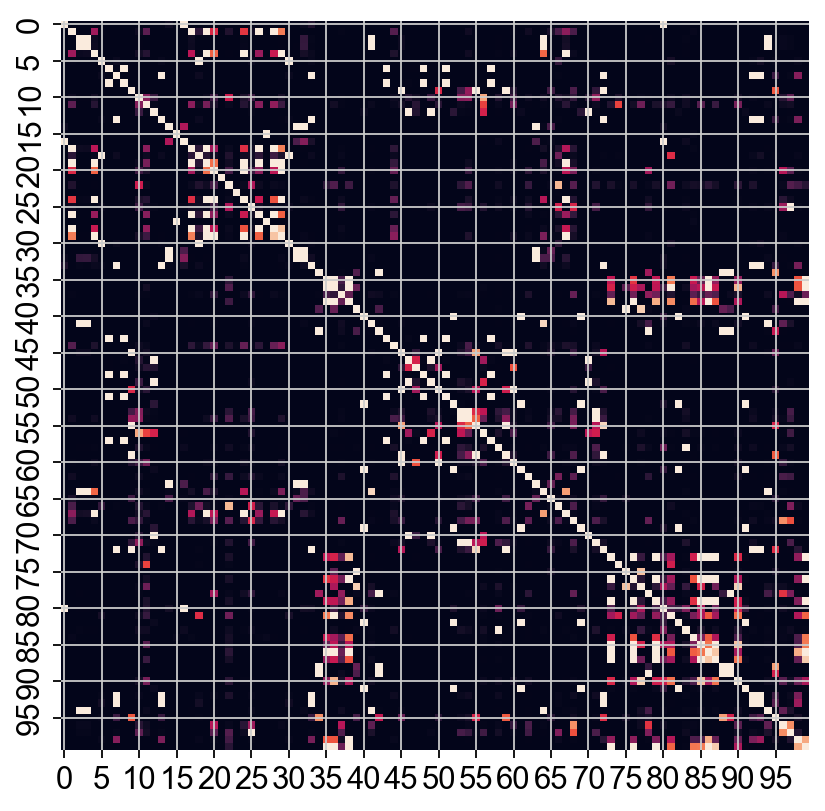

In [10]:
fig, ax = plt.subplots(figsize=(6,6))
sns.heatmap(norm_cooc_matrix[:100,:100], vmin=0, vmax=0.3, ax=ax, cbar=False)

<Axes: >

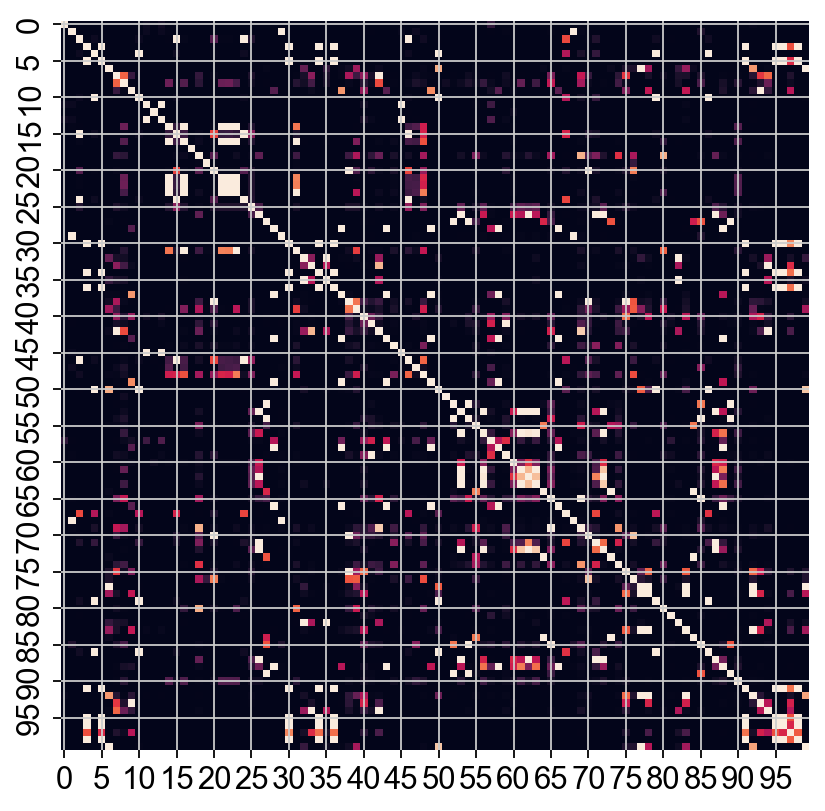

In [22]:
fig, ax = plt.subplots(figsize=(6,6))
sns.heatmap(norm_cooc_matrix[:100,:100], vmin=0, vmax=0.3, ax=ax, cbar=False)

In [11]:
adata_cluster = sc.read_h5ad('../../../../3_expts/processed_data/analysis_largefiles/adata_de_nde50ntotal50_varfiltered_simple.h5ad')
norm_cooc_matrix_df = pd.read_csv('../../../../3_expts/processed_data/analysis_largefiles/pca_params_screening_nde50ntotal50_varfiltered_simple_neighbor1563resolution24_cooc_matrix.csv',
                                  index_col=0)
norm_cooc_matrix_df = norm_cooc_matrix_df/norm_cooc_matrix_df.max()
distance_matrix_df = 1 - norm_cooc_matrix_df
sparse_cooc_matrix = csr_matrix(norm_cooc_matrix_df.values)
np.fill_diagonal(distance_matrix_df.values, 1)

In [12]:
distance_matrix_df.loc['IL4R_Stim48hr'].min()

0.31113309154852176

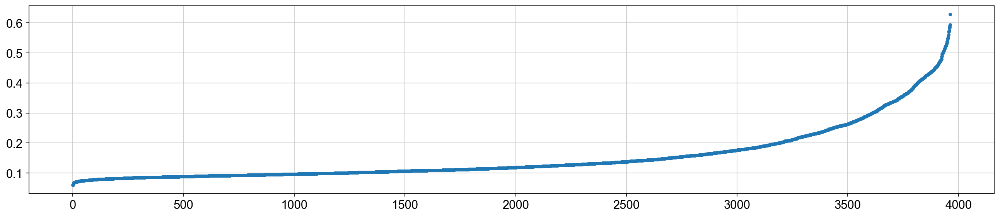

In [13]:
plt.plot(np.sort(distance_matrix_df.min(0)), '.')

In [16]:
# Run hdbscan
clusterer = hdbscan.HDBSCAN(metric='precomputed',
                            min_cluster_size=4,
                            min_samples=1,
                            cluster_selection_method='eom')
clusterer.fit(distance_matrix_df.values)
final_labels = clusterer.labels_
adata_cluster.obs['hdbscan'] = final_labels
adata_cluster.obs['hdbscan'] = adata_cluster.obs['hdbscan'].astype('category')
#adata_cluster = adata_cluster[adata_cluster.obs['hdbscan']!=-1].copy()

In [17]:
adata_cluster.obs.hdbscan.unique()

[19, 102, 55, 95, 18, ..., 93, 83, 45, 17, 131]
Length: 136
Categories (136, int64): [-1, 0, 1, 2, ..., 131, 132, 133, 134]

In [ ]:
adata_cluster[adata_cluster.obs.target_contrast_gene_name_corrected.isin(['IL4R', 'CD3D', 'COG6',
                                                                          'STAT5B', 'CD28', 'MED12', 'STAT3', 'RASA2', 'IRF4'])].obs.sort_values(by='target_contrast_gene_name_corrected')

In [ ]:
adata_cluster[adata_cluster.obs.hdbscan==127].obs.sort_values(by='target_contrast_gene_name_corrected')

In [21]:
adata_cluster

AnnData object with n_obs × n_vars = 3964 × 10864
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target', 'target_contrast_corrected', 'target_contrast_gene_name_corrected', 'hdbscan'
    var: 'gene_ids', 'gene_name'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'masked_zscore', 'p_value', 'zscore'

In [86]:
# # For each cluster, filter out perturbations that have low correlation with other genes
# filter_thres = 0.15
# perturbation_to_include = []
# for cl in adata_cluster.obs['hdbscan'].unique():
#     df = pd.DataFrame(data=adata_cluster[adata_cluster.obs['hdbscan']==cl].layers['zscore'],
#                       index=adata_cluster[adata_cluster.obs['hdbscan']==cl].obs_names,
#                       columns=adata_cluster.var_names)
#     df_corr = df.T.corr()
#     np.fill_diagonal(df_corr.values, 0)
#     perturbation_to_include = perturbation_to_include + df_corr.loc[df_corr.mean(0)>filter_thres].index.tolist()

# adata_cluster = adata_cluster[perturbation_to_include].copy()
# distance_matrix_df = distance_matrix_df.loc[perturbation_to_include, perturbation_to_include].copy()

# # Rerun hdbscan
# clusterer = hdbscan.HDBSCAN(metric='precomputed',
#                             min_cluster_size=4,
#                             min_samples=1, 
#                             cluster_selection_method='eom')
# clusterer.fit(distance_matrix_df.values)
# final_labels = clusterer.labels_
# adata_cluster.obs['hdbscan'] = final_labels
# adata_cluster.obs['hdbscan'] = adata_cluster.obs['hdbscan'].astype('category')
# adata_cluster = adata_cluster[adata_cluster.obs['hdbscan']!=-1].copy()

In [25]:
adata_final = adata_de[adata_cluster.obs_names].to_memory().copy()
adata_final.obs = adata_cluster.obs.copy()
adata_final.obs['hdbscan'] = adata_final.obs['hdbscan'].astype(int)

In [26]:
adata_final.write_h5ad('../../../../3_expts/processed_data/analysis_largefiles/nde50ntotal50_varfiltered_simple_clustering.h5ad')

In [5]:
adata_final = sc.read_h5ad('../../../../3_expts/processed_data/analysis_largefiles/nde50ntotal100_varfiltered_clustering_10232025.h5ad', backed='r')

In [15]:
adata_final[adata_final.obs.target_contrast_gene_name_corrected=='IL4R'].obs.sort_values(by='target_contrast_gene_name_corrected')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,target_contrast_corrected,target_contrast_gene_name_corrected,hdbscan


In [ ]:
adata_final[adata_final.obs.hdbscan==33].obs.sort_values(by='target_contrast_gene_name_corrected')#.iloc[:100]

In [72]:
adata_cluster.obs_names

Index(['ENSG00000104368_Stim8hr', 'ENSG00000128607_Stim8hr',
       'ENSG00000163600_Stim8hr', 'ENSG00000168876_Stim8hr',
       'ENSG00000174177_Stim8hr', 'ENSG00000108064_Stim48hr',
       'ENSG00000121210_Stim48hr', 'ENSG00000133028_Stim48hr',
       'ENSG00000134809_Stim48hr', 'ENSG00000172795_Stim48hr',
       ...
       'ENSG00000171105_Stim8hr', 'ENSG00000110799_Stim48hr',
       'ENSG00000116954_Stim48hr', 'ENSG00000120805_Stim48hr',
       'ENSG00000127152_Stim48hr', 'ENSG00000073584_Rest',
       'ENSG00000134323_Rest', 'ENSG00000137265_Rest', 'ENSG00000157426_Rest',
       'ENSG00000162604_Rest'],
      dtype='object', length=3035)

In [73]:
cl = 33
df = pd.DataFrame(data=adata_cluster[adata_cluster.obs['hdbscan']==cl].layers['zscore'],
                  index=adata_cluster[adata_cluster.obs['hdbscan']==cl].obs.target_contrast_gene_name_corrected,
                  columns=adata_cluster.var_names)
df_corr = df.T.corr()
np.fill_diagonal(df_corr.values, np.nan)

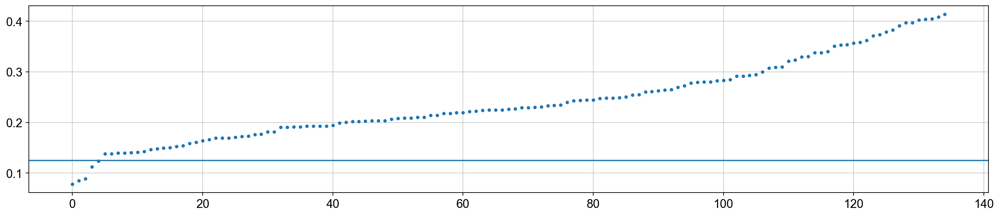

In [74]:
plt.plot(np.sort(df_corr.mean()), '.')
plt.axhline(0.125)

In [ ]:
df_corr.mean().sort_values()

In [7]:
np.sort(adata_final.obs.hdbscan.unique())

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67])

In [276]:
adata_cluster

AnnData object with n_obs × n_vars = 2086 × 8412
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target', 'target_contrast_corrected', 'target_contrast_gene_name_corrected', 'hdbscan'
    var: 'gene_ids', 'gene_name'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'masked_zscore', 'p_value', 'zscore'

In [47]:
Tcellsignal = ['CD3D','ZAP70','LAT','FYN','ITAM','ITK','GADS','ADAP','GRB2','PLCG1','PLCG2','WAS','RAC2','CD28','DEF6','CD2']

In [48]:
adata_cluster[adata_cluster.obs.target_contrast_gene_name_corrected.isin(Tcellsignal)].obs.sort_values(by='target_contrast_gene_name_corrected')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,target_contrast_corrected,target_contrast_gene_name_corrected,hdbscan
CD2_Stim8hr,CD2,Stim8hr,ENSG00000116824,675,378.0,ENSG00000116824,CD2,40
CD2_Stim48hr,CD2,Stim48hr,ENSG00000116824,64,478.0,ENSG00000116824,CD2,60
CD28_Stim8hr,CD28,Stim8hr,ENSG00000178562,99,675.0,ENSG00000178562,CD28,14
CD28_Stim48hr,CD28,Stim48hr,ENSG00000178562,401,514.0,ENSG00000178562,CD28,60
CD3D_Stim8hr,CD3D,Stim8hr,ENSG00000167286,436,185.0,ENSG00000167286,CD3D,15
CD3D_Stim48hr,CD3D,Stim48hr,ENSG00000167286,634,85.0,ENSG00000167286,CD3D,60
DEF6_Stim8hr,DEF6,Stim8hr,ENSG00000023892,447,541.0,ENSG00000023892,DEF6,14
ITK_Stim8hr,ITK,Stim8hr,ENSG00000113263,443,517.0,ENSG00000113263,ITK,14
ITK_Stim48hr,ITK,Stim48hr,ENSG00000113263,610,361.0,ENSG00000113263,ITK,60
LAT_Stim8hr,LAT,Stim8hr,ENSG00000213658,662,469.0,ENSG00000213658,LAT,15


In [279]:
adata_cluster[adata_cluster.obs.target_contrast_gene_name_corrected=='SMAD3'].obs.sort_values(by='target_contrast_gene_name_corrected')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,target_contrast_corrected,target_contrast_gene_name_corrected,hdbscan
SMAD3_Stim8hr,SMAD3,Stim8hr,ENSG00000166949,262,1758.0,ENSG00000166949,SMAD3,54
SMAD3_Rest,SMAD3,Rest,ENSG00000166949,502,1804.0,ENSG00000166949,SMAD3,61


In [ ]:
adata_cluster[adata_cluster.obs.hdbscan==40].obs.sort_values(by='target_contrast_gene_name_corrected')#.iloc[:100]

In [283]:
len(adata_cluster[adata_cluster.obs.hdbscan==8].obs)

104

In [8]:
def corr_compute(adata, gene_list):
    mask = adata.obs.target_contrast_gene_name_corrected.isin(genelist)
    rest = adata[adata[mask&(adata.obs.culture_condition=='Rest')].obs.sort_values(by='target_contrast_gene_name_corrected').index].layers['masked_zscore'].copy()
    stim8hr = adata[adata[mask&(adata.obs.culture_condition=='Stim8hr')].obs.sort_values(by='target_contrast_gene_name_corrected').index].layers['masked_zscore'].copy()
    stim48hr = adata[adata[mask&(adata.obs.culture_condition=='Stim48hr')].obs.sort_values(by='target_contrast_gene_name_corrected').index].layers['masked_zscore'].copy()
    
    list1 = adata[adata[mask&(adata.obs.culture_condition=='Rest')].obs.sort_values(by='target_contrast_gene_name_corrected').index].obs.target_contrast_gene_name_corrected.values.tolist()
    list2 = adata[adata[mask&(adata.obs.culture_condition=='Rest')].obs.sort_values(by='target_contrast_gene_name_corrected').index].obs.culture_condition.values.tolist()
    ind = [f"{item1}_{item2}" for item1, item2 in zip(list1, list2)]
    list1 = adata[adata[mask&(adata.obs.culture_condition=='Stim8hr')].obs.sort_values(by='target_contrast_gene_name_corrected').index].obs.target_contrast_gene_name_corrected.values.tolist()
    list2 = adata[adata[mask&(adata.obs.culture_condition=='Stim8hr')].obs.sort_values(by='target_contrast_gene_name_corrected').index].obs.culture_condition.values.tolist()
    ind = ind + [f"{item1}_{item2}" for item1, item2 in zip(list1, list2)]
    list1 = adata[adata[mask&(adata.obs.culture_condition=='Stim48hr')].obs.sort_values(by='target_contrast_gene_name_corrected').index].obs.target_contrast_gene_name_corrected.values.tolist()
    list2 = adata[adata[mask&(adata.obs.culture_condition=='Stim48hr')].obs.sort_values(by='target_contrast_gene_name_corrected').index].obs.culture_condition.values.tolist()
    ind = ind + [f"{item1}_{item2}" for item1, item2 in zip(list1, list2)]
    
    data = np.concatenate([rest, stim8hr, stim48hr])
            
    test = pd.DataFrame(data=data,
                        index=ind,
                        columns=adata.var_names)
    test2 = test.T.corr()
    return test2

In [221]:
adata_final = adata_cluster.copy()

<Figure size 213.333x133.333 with 0 Axes>

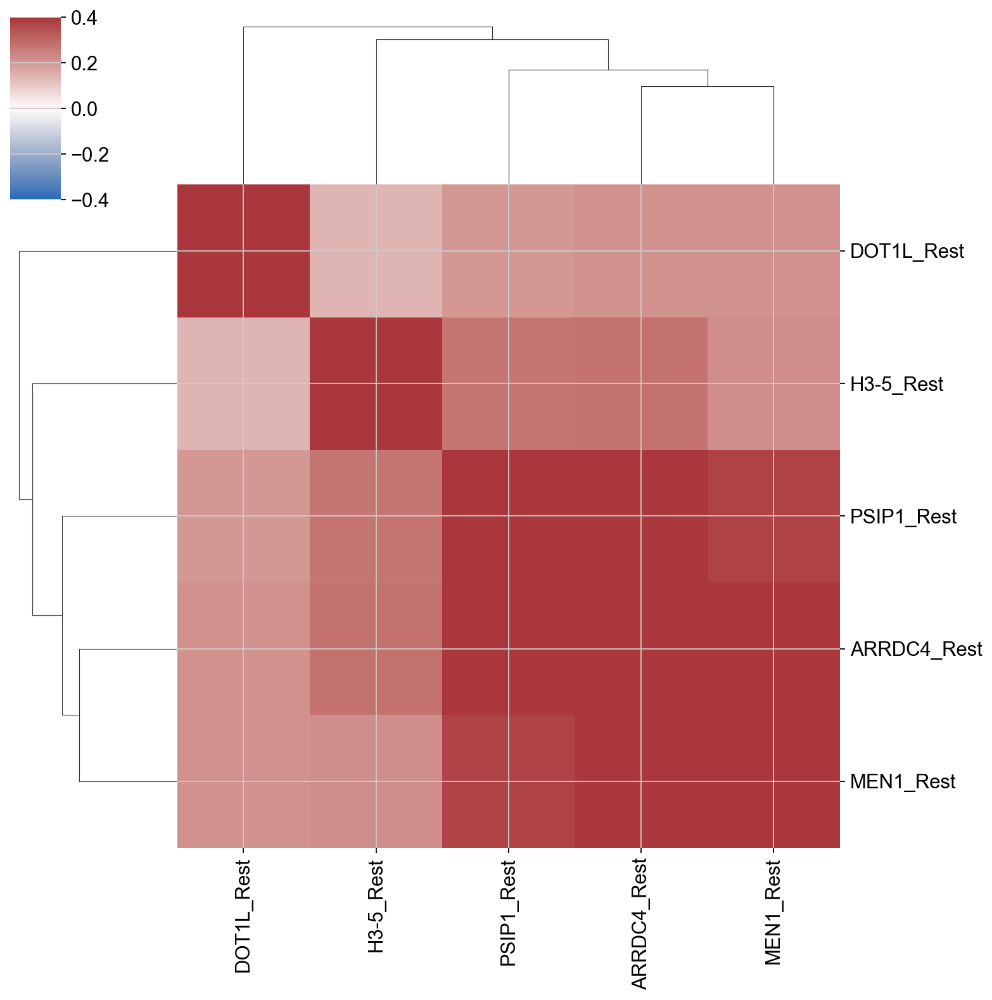

In [9]:
cl = 63
thres = 0.4

genelist = adata_final[adata_final.obs.hdbscan==cl].obs.target_contrast_gene_name_corrected.unique().tolist()
corr_mtx = corr_compute(adata_de, genelist)

# Reorder regulator based on hierarchical clustering of regulators in main conditions
# For each cluster, get regulator member list
regulator = adata_final[adata_final.obs['hdbscan']==cl].obs['target_contrast_gene_name_corrected'].unique().tolist()

plt.figure(figsize=(len(regulator)/3+1, len(regulator)/3))

main_condition = adata_final[adata_final.obs['hdbscan']==cl].obs['culture_condition'].value_counts().index[0]
regulator_main_condition = [item+'_'+main_condition for item in regulator]

# Get reordered downstream genes based on DE effect of main condition
clustermap = sns.clustermap(corr_mtx.loc[regulator_main_condition, regulator_main_condition], 
                            method='average', 
                            metric='euclidean',
                           cmap='vlag', vmin=-0.4, vmax=0.4)

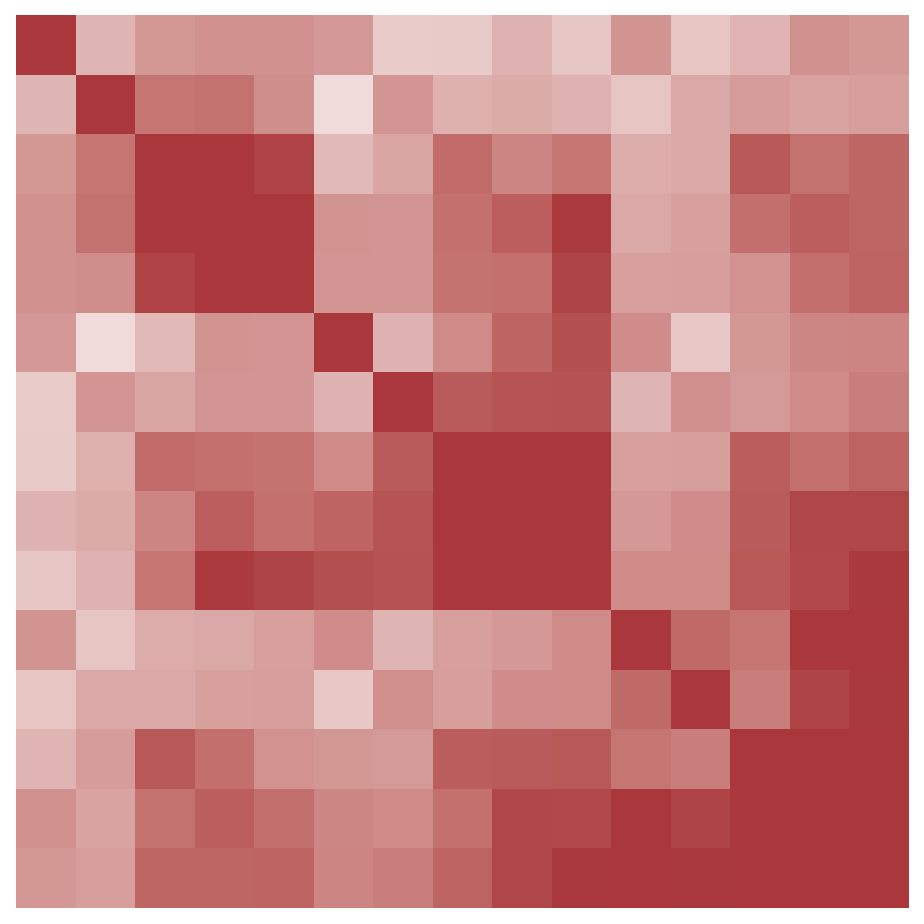

In [10]:
cl = 63
thres = 0.4

genelist = adata_final[adata_final.obs.hdbscan==cl].obs.target_contrast_gene_name_corrected.unique().tolist()
corr_mtx = corr_compute(adata_de, genelist)

# Reorder regulator based on hierarchical clustering of regulators in main conditions
# For each cluster, get regulator member list
regulator = adata_final[adata_final.obs['hdbscan']==cl].obs['target_contrast_gene_name_corrected'].unique().tolist()

plt.figure(figsize=(6, 6))

main_condition = adata_final[adata_final.obs['hdbscan']==cl].obs['culture_condition'].value_counts().index[0]
regulator_main_condition = [item+'_'+main_condition for item in regulator]

# Get reordered downstream genes based on DE effect of main condition
clustermap = sns.clustermap(corr_mtx.loc[regulator_main_condition, regulator_main_condition], 
                            method='average', 
                            metric='euclidean')
xticklabel_indices = clustermap.dendrogram_col.reordered_ind
plt.close(clustermap.fig)
regulator_reordered = np.array(regulator)[xticklabel_indices]

target_names_rest = adata_de[adata_de.obs['culture_condition']=='Rest'].obs['target_contrast_gene_name_corrected']
isin_mask = np.isin(regulator_reordered, target_names_rest)
regulator_rest = regulator_reordered[isin_mask]
regulator_rest = [item+'_Rest' for item in regulator_rest]
target_names_stim8hr = adata_de[adata_de.obs['culture_condition']=='Stim8hr'].obs['target_contrast_gene_name_corrected']
isin_mask = np.isin(regulator_reordered, target_names_stim8hr)
regulator_stim8hr = regulator_reordered[isin_mask]
regulator_stim8hr = [item+'_Stim8hr' for item in regulator_stim8hr]
target_names_stim48hr = adata_de[adata_de.obs['culture_condition']=='Stim48hr'].obs['target_contrast_gene_name_corrected']
isin_mask = np.isin(regulator_reordered, target_names_stim48hr)
regulator_stim48hr = regulator_reordered[isin_mask]
regulator_stim48hr = [item+'_Stim48hr' for item in regulator_stim48hr]
regulator_all = np.concatenate([regulator_rest, regulator_stim8hr, regulator_stim48hr])

sns.heatmap(corr_mtx.loc[regulator_all, regulator_all], vmin=-thres, vmax=thres, cmap='vlag',
            cbar=False, xticklabels=False, yticklabels=False)
plt.tick_params(labelsize=8)
plt.tight_layout()

In [76]:
cl = 33
thres = 0.4

genelist = adata_final[adata_final.obs.hdbscan==cl].obs.target_contrast_gene_name_corrected.unique().tolist()
corr_mtx = corr_compute(adata_de, genelist)

# Reorder regulator based on hierarchical clustering of regulators in main conditions
# For each cluster, get regulator member list
regulator = adata_final[adata_final.obs['hdbscan']==cl].obs['target_contrast_gene_name_corrected'].unique().tolist()

plt.figure(figsize=(len(regulator)/3+1, len(regulator)/3))

main_condition = adata_final[adata_final.obs['hdbscan']==cl].obs['culture_condition'].value_counts().index[0]
regulator_main_condition = [item+'_'+main_condition for item in regulator]

# Get reordered downstream genes based on DE effect of main condition
clustermap = sns.clustermap(corr_mtx.loc[regulator_main_condition, regulator_main_condition], 
                            method='average', 
                            metric='euclidean')
xticklabel_indices = clustermap.dendrogram_col.reordered_ind
plt.close(clustermap.fig)
regulator_reordered = np.array(regulator)[xticklabel_indices]

target_names_rest = adata_de[adata_de.obs['culture_condition']=='Rest'].obs['target_contrast_gene_name_corrected']
isin_mask = np.isin(regulator_reordered, target_names_rest)
regulator_rest = regulator_reordered[isin_mask]
regulator_rest = [item+'_Rest' for item in regulator_rest]
target_names_stim8hr = adata_de[adata_de.obs['culture_condition']=='Stim8hr'].obs['target_contrast_gene_name_corrected']
isin_mask = np.isin(regulator_reordered, target_names_stim8hr)
regulator_stim8hr = regulator_reordered[isin_mask]
regulator_stim8hr = [item+'_Stim8hr' for item in regulator_stim8hr]
target_names_stim48hr = adata_de[adata_de.obs['culture_condition']=='Stim48hr'].obs['target_contrast_gene_name_corrected']
isin_mask = np.isin(regulator_reordered, target_names_stim48hr)
regulator_stim48hr = regulator_reordered[isin_mask]
regulator_stim48hr = [item+'_Stim48hr' for item in regulator_stim48hr]
regulator_all = np.concatenate([regulator_rest, regulator_stim8hr, regulator_stim48hr])

sns.heatmap(corr_mtx.loc[regulator_all, regulator_all], vmin=-thres, vmax=thres, cmap='vlag',
            cbar=False, xticklabels=False, yticklabels=corr_mtx.index)
plt.tick_params(labelsize=8)
plt.tight_layout()

In [8]:
clusterer = hdbscan.HDBSCAN(metric='precomputed',
                            min_cluster_size=4,
                            min_samples=3,
                            cluster_selection_method='eom')
clusterer.fit(distance_matrix)
final_labels = clusterer.labels_
adata_cluster.obs['hdbscan'] = final_labels
adata_cluster.obs['hdbscan'] = adata_cluster.obs['hdbscan'].astype('category')

In [9]:
adata_cluster.obs['hdbscan'].unique()

[36, 92, 66, 100, 20, ..., 67, 13, 16, 8, 78]
Length: 107
Categories (107, int64): [-1, 0, 1, 2, ..., 102, 103, 104, 105]

In [ ]:
adata_cluster[adata_cluster.obs.target_contrast_gene_name_corrected.str.startswith(('SMG', 'DPH', 'TSC','LAMTOR', 'ELP', 'MED12', 'TAF', 'CD3', 'PTPRC', 'CD28', 'ACLY','INTS'))].obs.sort_values(by='target_contrast_gene_name_corrected')

In [43]:
testlist = ['AQP1','CD69','ENKUR','PTPN2','IL21R','IRF1','MBD2','MAPK9','ARRDC4','PSMF1','RSBN1L','SELL','SMAGP','THAP2','TRAF3','XRRA1','LAT2','MTA2','ELOB','WAS','FBRS','MEN1','ATP2A2','MEAF6','TMED9']

In [ ]:
adata_cluster[adata_cluster.obs.target_contrast_gene_name_corrected.isin(testlist)].obs.sort_values(by='target_contrast_gene_name_corrected')

In [50]:
testlist = ['ARHGAP27', 'CDK2', 'PRKCQ', 'TXNDC9', 'COG6', 'SIK3', 'IKZF1', 'PKN3', 'HTT', 'NUSAP1', 'PDCD5', 'STAT5A', 'ICE2', 'MYO9A', 'KAT2B', 'FOXO1', 'PIBF1', 'CD28', 'PTPRC', 'PPCDC']

In [ ]:
adata_cluster[adata_cluster.obs.target_contrast_gene_name_corrected.isin(testlist)].obs.sort_values(by='target_contrast_gene_name_corrected')

In [27]:
de_summary_stats[de_summary_stats.target_name=='PPCS']

,target_contrast,target_name,condition,n_cells_target,n_up_genes,n_down_genes,n_total_de_genes,ontarget_effect_size,ontarget_significant,baseMean,offtarget_flag,n_total_genes_category,ontarget_effect_category,target_contrast_corrected,obs_names,target_name_corrected
2072,ENSG00000127125,PPCS,Rest,137.0,523,153,676,-3.932838,True,20.314772,False,>10 DE genes,on-target KD,ENSG00000127125,ENSG00000127125_Rest,PPCS
4872,ENSG00000127125,PPCS,Stim8hr,138.0,492,300,792,-5.133298,True,26.464996,False,>10 DE genes,on-target KD,ENSG00000127125,ENSG00000127125_Stim8hr,PPCS
11952,ENSG00000127125,PPCS,Stim48hr,52.0,145,24,169,-1.067717,False,28.424935,False,>10 DE genes,no on-target KD,ENSG00000127125,ENSG00000127125_Stim48hr,PPCS


In [54]:
adata_cluster[adata_cluster.obs.hdbscan==25].obs.sort_values(by='target_contrast_gene_name_corrected')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,target_contrast_corrected,target_contrast_gene_name_corrected,hdbscan
ENSG00000131473_Stim48hr,ACLY,Stim48hr,ENSG00000131473,570,282.0,ENSG00000131473,ACLY,25
ENSG00000062485_Stim48hr,CS,Stim48hr,ENSG00000062485,469,232.0,ENSG00000062485,CS,25
ENSG00000150768_Stim48hr,DLAT,Stim48hr,ENSG00000150768,392,372.0,ENSG00000150768,DLAT,25
ENSG00000146701_Stim48hr,MDH2,Stim48hr,ENSG00000146701,182,998.0,ENSG00000146701,MDH2,25
ENSG00000131828_Stim48hr,PDHA1,Stim48hr,ENSG00000131828,454,192.0,ENSG00000131828,PDHA1,25
ENSG00000168291_Stim48hr,PDHB,Stim48hr,ENSG00000168291,155,303.0,ENSG00000168291,PDHB,25
ENSG00000100075_Stim48hr,SLC25A1,Stim48hr,ENSG00000100075,102,521.0,ENSG00000100075,SLC25A1,25
ENSG00000127952_Stim48hr,STYXL1,Stim48hr,ENSG00000127952,671,753.0,ENSG00000127952,STYXL1,25


In [12]:
adata_cluster[adata_cluster.obs.hdbscan==12].obs.target_contrast_gene_name_corrected.tolist()

['MBD3', 'MBD3', 'MBD3', 'CHD4', 'MTA2', 'MTA2', 'MTA2', 'CHD4', 'CHD4']

In [33]:
adata_cluster

AnnData object with n_obs × n_vars = 3621 × 10799
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target', 'target_contrast_corrected', 'target_contrast_gene_name_corrected', 'hdbscan'
    var: 'gene_ids', 'gene_name'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'

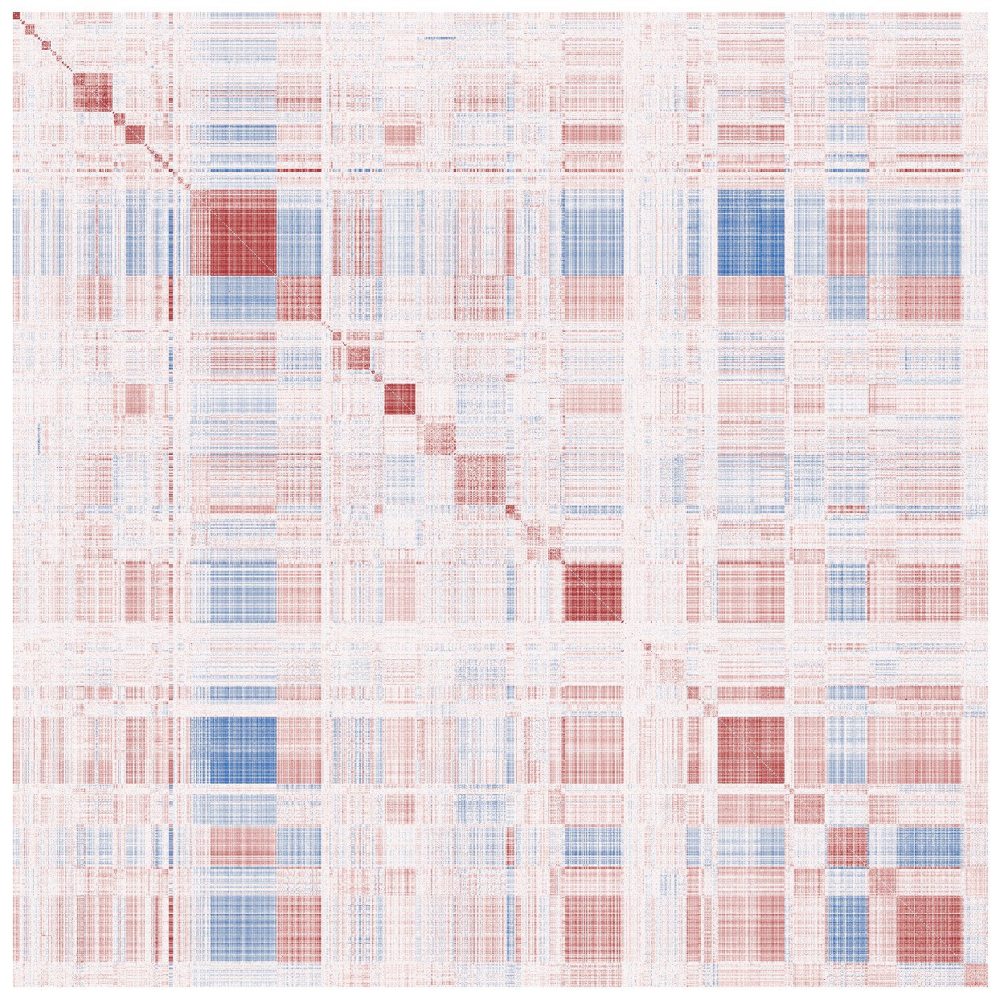

In [28]:
fig, ax = plt.subplots(figsize=(8,8))
cluster_label = 'hdbscan'
j = 0
data = adata_cluster[adata_cluster.obs[cluster_label]==j].layers['zscore']
list1 = adata_cluster[adata_cluster.obs[cluster_label]==j].obs.target_contrast_gene_name_corrected.values.tolist()
list2 = adata_cluster[adata_cluster.obs[cluster_label]==j].obs.culture_condition.values.tolist()
ind = [f"{item1}_{item2}" for item1, item2 in zip(list1, list2)]
for i in range(j,104):
    data = np.concatenate([data, adata_cluster[adata_cluster.obs[cluster_label]==i+1].layers['zscore']])
    list1 = adata_cluster[adata_cluster.obs[cluster_label]==i+1].obs.target_contrast_gene_name.values.tolist()
    list2 = adata_cluster[adata_cluster.obs[cluster_label]==i+1].obs.culture_condition.values.tolist()
    ind = ind +[f"{item1}_{item2}" for item1, item2 in zip(list1, list2)]
    
test = pd.DataFrame(data=data,
                    index=ind,
                    columns=adata_cluster.var_names)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, xticklabels=False, yticklabels=False, cmap='vlag', cbar=False, ax=ax)
plt.tight_layout()

### Filter out low quality hdbscan clusters

In [55]:
np.max(adata_cluster.obs['hdbscan'].astype(int))

105

In [56]:
num_of_cluster = np.max(adata_cluster.obs['hdbscan'].astype(int))+1
corr = np.zeros(num_of_cluster)
cluster_size = np.zeros(num_of_cluster)
cluster_gene_size = np.zeros(num_of_cluster)
cluster_member = []
for i in range(len(corr)):
    list1 = adata_cluster[adata_cluster.obs['hdbscan']==i].obs.target_contrast_gene_name_corrected.values.tolist()
    list2 = adata_cluster[adata_cluster.obs['hdbscan']==i].obs.culture_condition.values.tolist()
    test = pd.DataFrame(data=adata_cluster[adata_cluster.obs['hdbscan']==i].layers['zscore'],
                        index=[f"{item1}_{item2}" for item1, item2 in zip(list1, list2)],
                        columns=adata_cluster.var.gene_name)
    test2 = test.T.corr()
    np.fill_diagonal(test2.values, 0)
    corr[i] = np.mean(test2)
    cluster_size[i] = len(test)
    cluster_gene_size[i] = len(adata_cluster[adata_cluster.obs['hdbscan']==i].obs.target_contrast_gene_name_corrected.unique())
    cluster_member.append(adata_cluster[adata_cluster.obs['hdbscan']==i].obs.target_contrast_gene_name_corrected.unique().tolist())

cluster_df = pd.DataFrame({'cluster': np.arange(0, num_of_cluster, 1),
                           'intracluster_corr': corr,
                           'cluster_size': cluster_size,
                           'cluster_gene_size': cluster_gene_size,
                           'cluster_member': cluster_member})

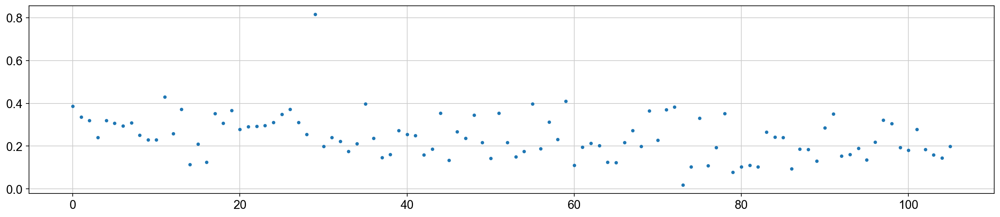

In [57]:
plt.plot(cluster_df.intracluster_corr, '.')

In [58]:
adata_final = adata_cluster.copy()
adata_final.obs.loc[adata_final.obs['hdbscan'].isin(np.where(cluster_df.intracluster_corr<0.2)[0]), 'hdbscan'] = -1
adata_final.obs.loc[adata_final.obs['hdbscan'].isin(np.where(cluster_gene_size<3)[0]), 'hdbscan'] = -1
adata_final.obs['hdbscan'] = adata_final.obs['hdbscan'].astype('category')
adata_final = adata_final[adata_final.obs.hdbscan!=-1].copy()

In [59]:
adata_final.obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,target_contrast_corrected,target_contrast_gene_name_corrected,hdbscan
ENSG00000104368_Stim8hr,PLAT,Stim8hr,ENSG00000104368,0,411.0,ENSG00000104368,PLAT,36
ENSG00000128607_Stim8hr,KLHDC10,Stim8hr,ENSG00000128607,0,1257.0,ENSG00000128607,KLHDC10,66
ENSG00000163600_Stim8hr,ICOS,Stim8hr,ENSG00000163600,0,658.0,ENSG00000163600,ICOS,66
ENSG00000174177_Stim8hr,CTU2,Stim8hr,ENSG00000174177,0,500.0,ENSG00000174177,CTU2,20
ENSG00000108064_Stim48hr,TFAM,Stim48hr,ENSG00000108064,1,414.0,ENSG00000108064,TFAM,71
...,...,...,...,...,...,...,...,...
ENSG00000127152_Stim48hr,BCL11B,Stim48hr,ENSG00000127152,679,203.0,ENSG00000127152,BCL11B,101
ENSG00000134323_Rest,MYCN,Rest,ENSG00000134323,680,924.0,ENSG00000134323,MYCN,21
ENSG00000137265_Rest,MUM1,Rest,ENSG00000137265,680,803.0,ENSG00000137265,IRF4,90
ENSG00000157426_Rest,AASDH,Rest,ENSG00000157426,680,651.0,ENSG00000157426,AASDH,91


In [60]:
len(adata_final.obs['hdbscan'].unique())

55

In [61]:
adata_final.obs.target_contrast_gene_name.unique()

['PLAT', 'KLHDC10', 'ICOS', 'CTU2', 'TFAM', ..., 'TYK2', 'TRMT6', 'VWF', 'ARL1', 'BCL11B']
Length: 1354
Categories (1354, object): ['A2M', 'AASDH', 'ABCA3', 'ABCC1', ..., 'ZSCAN25', 'ZSWIM4', 'ZSWIM9', 'ZW10']

In [62]:
import gseapy
from gseapy import Msigdb
from gseapy import barplot, dotplot

msig = Msigdb()
kegg_gene_sets = msig.get_gmt(category= 'c2.cp.kegg_legacy', dbver="2025.1.Hs")
reactome_gene_sets = msig.get_gmt(category= 'c2.cp.reactome', dbver="2025.1.Hs")

In [63]:
corum_df = pd.read_csv('../../../RZAnalysisCodes/results/CORUM/corum_humanComplexes.txt', delimiter='\t', index_col='complex_id')
stringdb = pd.read_csv('../../../RZAnalysisCodes/results/STRINGDB/9606.clusters.proteins.v12.0.txt.gz', delimiter='\t', compression='gzip')
protein_info = pd.read_csv('../../../RZAnalysisCodes/results/STRINGDB/9606.protein.info.v12.0.txt.gz', delimiter='\t', compression='gzip')
cluster_info = pd.read_csv('../../../RZAnalysisCodes/results/STRINGDB/9606.clusters.info.v12.0.txt.gz', delimiter='\t', compression='gzip')
stringdb_df = pd.merge(stringdb, protein_info, left_on='protein_id', right_on='#string_protein_id')
stringdb_df = pd.merge(stringdb_df, cluster_info, left_on='cluster_id', right_on='cluster_id')
stringdb_df = stringdb_df[stringdb_df.cluster_size<1000].copy()

corum_complexes = {}
for _, row in corum_df.iterrows():
    complex_name = row['complex_name']
    subunits = set(row['subunits_gene_name'].split(';'))
    corum_complexes[complex_name] = subunits

stringdb_complexes = {}
for cluster_id in stringdb_df.cluster_id.unique():
    stringdb_complexes[cluster_id] = set(stringdb_df[stringdb_df.cluster_id==cluster_id].preferred_name)

In [64]:
def assess_complex_enrichment(adata, complexes, cluster_label):
    """
    Assess pathway/complex enrichment
    """
    de_genes_per_cluster = {}
    leiden_clusters = adata.obs[cluster_label].unique()
    for cluster in leiden_clusters:
        cluster_genes = adata[adata.obs[cluster_label] == cluster].obs.target_contrast_gene_name_corrected
        de_genes_per_cluster[cluster] = set(cluster_genes)
    
    N = len(adata)
    
    best_result = []
    all_result = []
    for cluster, de_genes in de_genes_per_cluster.items():
        n = len(de_genes)
        best_result_for_cluster = None # Initialize a variable to track the best result for this cluster
        for complex_name, subunits in complexes.items():
            K = len(subunits)
            # Find the overlap between DE genes and complex subunits
            overlap = de_genes.intersection(subunits)
            k = len(overlap)
            
            # Calculate the p-value
            if n > 0 and K > 0: # Avoid division by zero or trivial cases
                pval = hypergeom.sf(k - 1, N, K, n) # sf is survival function
                
                # Adjust for multiple testing (e.g., using Benjamini-Hochberg)
                # This is a crucial step to avoid false positives
                # Store raw p-values and correct later
                current_result = {
                    'cluster': cluster,
                    'complex': complex_name,
                    'overlap_genes': list(overlap),
                    'overlap_fraction': len(overlap)/n,
                    'raw_p_value': pval,
                    'complex_size': K
                }
                
                if (best_result_for_cluster is None) or (pval < best_result_for_cluster['raw_p_value']):
                    best_result_for_cluster = current_result
                if pval < 5e-2:
                    all_result.append(current_result)
        
        if best_result_for_cluster is not None:
            if best_result_for_cluster['raw_p_value']<1:
                best_result.append(best_result_for_cluster)
    
    # Convert results to a DataFrame for easy viewing
    best_result_df = pd.DataFrame(best_result)
    best_result_df = best_result_df.sort_values(by='cluster').reset_index(drop=True)
    all_result_df = pd.DataFrame(all_result)
    all_result_df = all_result_df.sort_values(by='cluster').reset_index(drop=True)

    return all_result_df, best_result_df

In [65]:
# STRINGDB enrichment
stringdb_enrichment_all, stringdb_enrichment_best = assess_complex_enrichment(adata_final, stringdb_complexes, 'hdbscan')
stringdb_enrichment_all = pd.merge(stringdb_enrichment_all, stringdb_df[['cluster_id', 'best_described_by']].drop_duplicates(), left_on='complex', right_on='cluster_id')
stringdb_enrichment_all = stringdb_enrichment_all.drop(columns=['cluster_id'])
stringdb_enrichment_best = pd.merge(stringdb_enrichment_best, stringdb_df[['cluster_id', 'best_described_by']].drop_duplicates(), left_on='complex', right_on='cluster_id')
stringdb_enrichment_best = stringdb_enrichment_best.drop(columns=['cluster_id'])
# Corum enrichment
corum_enrichment_all, corum_enrichment_best = assess_complex_enrichment(adata_final, corum_complexes, 'hdbscan')
# KEGG enrichment
kegg_enrichment_all, kegg_enrichment_best = assess_complex_enrichment(adata_final, kegg_gene_sets, 'hdbscan')
# Reactome enrichment
reactome_enrichment_all, reactome_enrichment_best = assess_complex_enrichment(adata_final, reactome_gene_sets, 'hdbscan')

# Also checking inter-cluster overlap
gene_grouping = {}
for cluster in adata_final.obs.hdbscan.unique():
    gene_grouping[cluster] = set(adata_final[adata_final.obs['hdbscan']==cluster].obs.target_contrast_gene_name_corrected)

intercluster_enrichment_all, _ = assess_complex_enrichment(adata_final, gene_grouping, 'hdbscan')
intercluster_enrichment_all = intercluster_enrichment_all[intercluster_enrichment_all.cluster!=intercluster_enrichment_all.complex].copy()
intercluster_enrichment_all = intercluster_enrichment_all[intercluster_enrichment_all.raw_p_value<1e-2].copy()
intercluster_enrichment_all = intercluster_enrichment_all[intercluster_enrichment_all.overlap_fraction>=0.2].copy()
intercluster_enrichment_summary = {}

for cluster in intercluster_enrichment_all.cluster.unique():
    intercluster_enrichment_summary[cluster] = set(intercluster_enrichment_all[intercluster_enrichment_all.cluster==cluster].complex)

intercluster_enrichment_summary_df = pd.DataFrame(intercluster_enrichment_summary.items(), columns=['cluster', 'related_cluster'])

# Summarize results
enrichment_df1 = pd.merge(corum_enrichment_best, stringdb_enrichment_best, on='cluster', how='outer', suffixes=('_corum', '_stringdb'))
enrichment_df2 = pd.merge(kegg_enrichment_best, reactome_enrichment_best, on='cluster', how='outer', suffixes=('_kegg', '_reactome'))
enrichment_df = pd.merge(enrichment_df1, enrichment_df2, on='cluster', how='outer')
enrichment_df = pd.merge(enrichment_df, cluster_df, on='cluster', how='inner')
enrichment_df = pd.merge(enrichment_df, intercluster_enrichment_summary_df, on='cluster', how='outer')

# Add timepoint information
cluster_member_with_condition = []
for index, row in enrichment_df.iterrows():
    list1 = adata_final[adata_final.obs.hdbscan==row.cluster].obs.target_contrast_gene_name_corrected.tolist()
    list2 = adata_final[adata_final.obs.hdbscan==row.cluster].obs.culture_condition.tolist()
    cluster_member_with_condition.append([f"{item1}_{item2}" for item1, item2 in zip(list1, list2)])
    enrichment_df.loc[index, 'rest_count'] = len(adata_final[(adata_final.obs.hdbscan==row.cluster)&(adata_final.obs.culture_condition=='Rest')])
    enrichment_df.loc[index, 'stim8hr_count'] = len(adata_final[(adata_final.obs.hdbscan==row.cluster)&(adata_final.obs.culture_condition=='Stim8hr')])
    enrichment_df.loc[index, 'stim48hr_count'] = len(adata_final[(adata_final.obs.hdbscan==row.cluster)&(adata_final.obs.culture_condition=='Stim48hr')])
    
enrichment_df['cluster_member_with_condition'] = cluster_member_with_condition

In [66]:
enrichment_df.to_parquet('results/clustering_nde50ntotal100.parquet')
enrichment_df.to_csv('results/clustering_nde50ntotal100.csv')
corum_enrichment_all.to_parquet('results/corum_enrichment_nde50ntotal100.parquet')
corum_enrichment_all.to_csv('results/corum_enrichment_nde50ntotal100.csv')
stringdb_enrichment_all.to_parquet('results/stringdb_enrichment_nde50ntotal100.parquet')
stringdb_enrichment_all.to_csv('results/stringdb_enrichment_nde50ntotal100.csv')
kegg_enrichment_all.to_parquet('results/kegg_enrichment_nde50ntotal100.parquet')
kegg_enrichment_all.to_csv('results/kegg_enrichment_nde50ntotal100.csv')
reactome_enrichment_all.to_parquet('results/reactome_enrichment_nde50ntotal100.parquet')
reactome_enrichment_all.to_csv('results/reactome_enrichment_nde50ntotal100.csv')

In [67]:
adata_final.write_h5ad('../../../RZAnalysisCodes/results/nde50ntotal100_varfiltered_clustering.h5ad')

In [14]:
adata_final = sc.read_h5ad('../../../RZAnalysisCodes/results/nde50ntotal100_varfiltered_clustering.h5ad')

In [16]:
def corr_compute(adata, gene_list):
    mask = adata.obs.target_contrast_gene_name_corrected.isin(genelist)
    rest = adata[adata[mask&(adata.obs.culture_condition=='Rest')].obs.sort_values(by='target_contrast_gene_name_corrected').index].X.copy()
    stim8hr = adata[adata[mask&(adata.obs.culture_condition=='Stim8hr')].obs.sort_values(by='target_contrast_gene_name_corrected').index].X.copy()
    stim48hr = adata[adata[mask&(adata.obs.culture_condition=='Stim48hr')].obs.sort_values(by='target_contrast_gene_name_corrected').index].X.copy()
    list1 = adata[adata[mask&(adata.obs.culture_condition=='Rest')].obs.sort_values(by='target_contrast_gene_name_corrected').index].obs.target_contrast_gene_name_corrected.values.tolist()
    list2 = adata[adata[mask&(adata.obs.culture_condition=='Rest')].obs.sort_values(by='target_contrast_gene_name_corrected').index].obs.culture_condition.values.tolist()
    ind = [f"{item1}_{item2}" for item1, item2 in zip(list1, list2)]
    list1 = adata[adata[mask&(adata.obs.culture_condition=='Stim8hr')].obs.sort_values(by='target_contrast_gene_name_corrected').index].obs.target_contrast_gene_name_corrected.values.tolist()
    list2 = adata[adata[mask&(adata.obs.culture_condition=='Stim8hr')].obs.sort_values(by='target_contrast_gene_name_corrected').index].obs.culture_condition.values.tolist()
    ind = ind + [f"{item1}_{item2}" for item1, item2 in zip(list1, list2)]
    list1 = adata[adata[mask&(adata.obs.culture_condition=='Stim48hr')].obs.sort_values(by='target_contrast_gene_name_corrected').index].obs.target_contrast_gene_name_corrected.values.tolist()
    list2 = adata[adata[mask&(adata.obs.culture_condition=='Stim48hr')].obs.sort_values(by='target_contrast_gene_name_corrected').index].obs.culture_condition.values.tolist()
    ind = ind + [f"{item1}_{item2}" for item1, item2 in zip(list1, list2)]
    
    data = np.concatenate([rest, stim8hr, stim48hr])
            
    test = pd.DataFrame(data=data,
                        index=ind,
                        columns=adata.var_names)
    test2 = test.T.corr()
    return test2

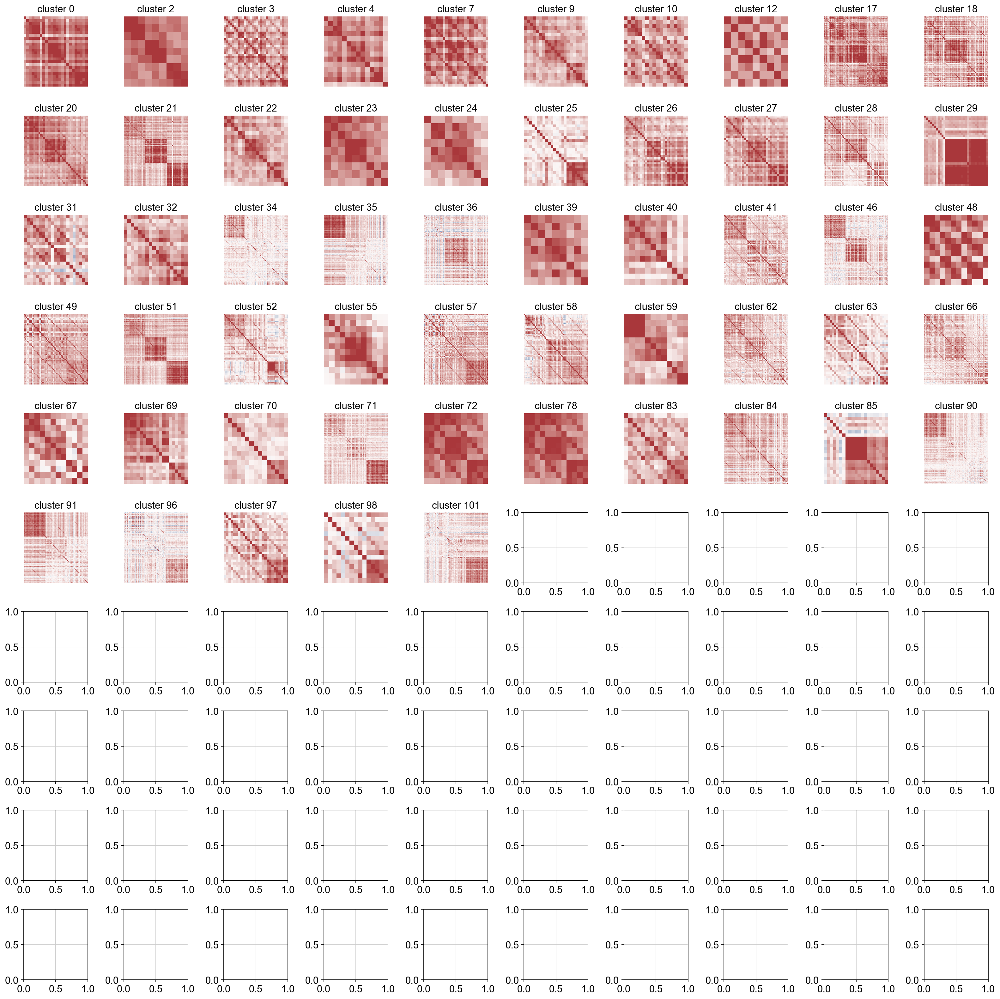

In [69]:
fig, axes = plt.subplots(10,10,figsize=(20,20))
ax = axes.flatten()
cluster_list = np.sort(adata_final.obs.hdbscan.unique())
for i in range(55):
    genelist = adata_final[adata_final.obs.hdbscan==cluster_list[i]].obs.target_contrast_gene_name_corrected.unique().tolist()
    corr_mtx = corr_compute(adata_de, genelist)
    sns.heatmap(corr_mtx, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax[i], xticklabels=[], yticklabels=[], cbar=False)
    ax[i].set_title('cluster '+str(cluster_list[i]))
plt.tight_layout()

In [70]:
adata_final[adata_final.obs.target_contrast_gene_name.str.startswith('MRPL')]

View of AnnData object with n_obs × n_vars = 41 × 10799
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target', 'target_contrast_corrected', 'target_contrast_gene_name_corrected', 'hdbscan'
    var: 'gene_ids', 'gene_name'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'

In [107]:
adata_final[adata_final.obs.hdbscan==78].obs.sort_values(by='target_contrast_gene_name_corrected')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,target_contrast_corrected,target_contrast_gene_name_corrected,hdbscan
ENSG00000181090_Stim48hr,EHMT1,Stim48hr,ENSG00000181090,438,1626.0,ENSG00000181090,EHMT1,78
ENSG00000204371_Stim48hr,EHMT2,Stim48hr,ENSG00000204371,324,629.0,ENSG00000204371,EHMT2,78
ENSG00000011451_Stim48hr,WIZ,Stim48hr,ENSG00000011451,504,1115.0,ENSG00000011451,WIZ,78
ENSG00000122482_Stim48hr,ZNF644,Stim48hr,ENSG00000122482,414,591.0,ENSG00000122482,ZNF644,78


In [104]:
adata_cluster[adata_cluster.obs.target_contrast_gene_name_corrected.str.startswith('LCK')].obs.sort_values(by='target_contrast_gene_name_corrected')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,target_contrast_corrected,target_contrast_gene_name_corrected,hdbscan
ENSG00000182866_Stim8hr,LCK,Stim8hr,ENSG00000182866,59,116.0,ENSG00000182866,LCK,36
ENSG00000182866_Stim48hr,LCK,Stim48hr,ENSG00000182866,432,107.0,ENSG00000182866,LCK,101
ENSG00000182866_Rest,LCK,Rest,ENSG00000182866,459,102.0,ENSG00000182866,LCK,90


,target_contrast,target_name,condition,n_cells_target,n_up_genes,n_down_genes,n_total_de_genes,ontarget_effect_size,ontarget_significant,baseMean,offtarget_flag,n_total_genes_category,ontarget_effect_category,target_contrast_corrected,obs_names,target_name_corrected
2370,ENSG00000128683,GAD1,Stim48hr,733.0,0,1,1,-6.418918,True,9.808407,False,1 DE gene,on-target KD,ENSG00000128683,ENSG00000128683_Stim48hr,GAD1
12462,ENSG00000128683,GAD1,Stim8hr,673.0,1,1,2,-4.389556,True,4.670098,False,2-10 DE genes,on-target KD,ENSG00000128683,ENSG00000128683_Stim8hr,GAD1
31086,ENSG00000128683,GAD1,Rest,723.0,2,0,2,-2.358590,False,1.034175,False,2-10 DE genes,no on-target KD,ENSG00000128683,ENSG00000128683_Rest,GAD1


In [98]:
adata_cluster[adata_cluster.obs.target_contrast_gene_name=='ITK'].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,target_contrast_corrected,target_contrast_gene_name_corrected,hdbscan
ENSG00000113263_Stim8hr,ITK,Stim8hr,ENSG00000113263,443,517.0,ENSG00000113263,ITK,36
ENSG00000113263_Stim48hr,ITK,Stim48hr,ENSG00000113263,610,361.0,ENSG00000113263,ITK,101


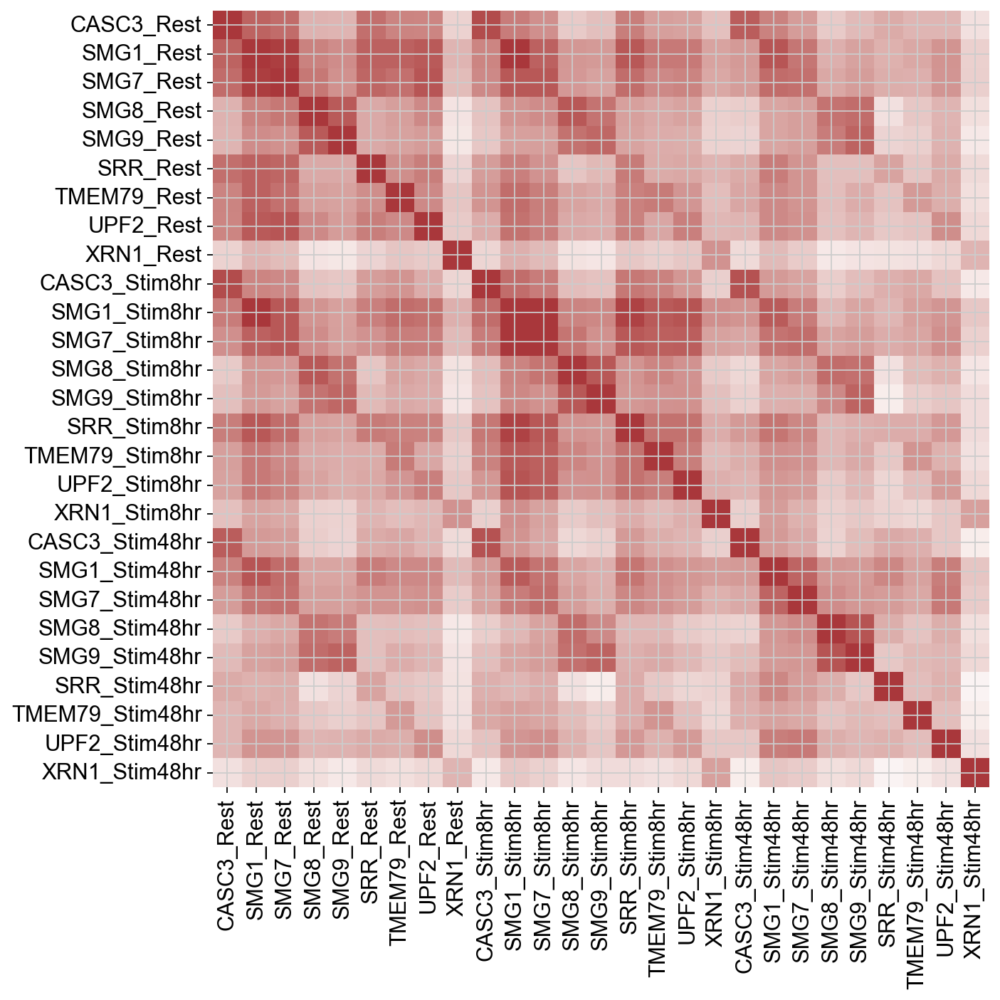

In [115]:
plt.figure(figsize=(9, 9))
genelist = adata_final[adata_final.obs.hdbscan==7].obs.target_contrast_gene_name_corrected.unique().tolist()
corr_mtx = corr_compute(adata_de, genelist)
sns.heatmap(corr_mtx, vmin=-0.7, vmax=0.7, cmap='vlag', cbar=False)
plt.tight_layout()
plt.savefig('results/cluster7.png')

In [22]:
len(genelist)

195

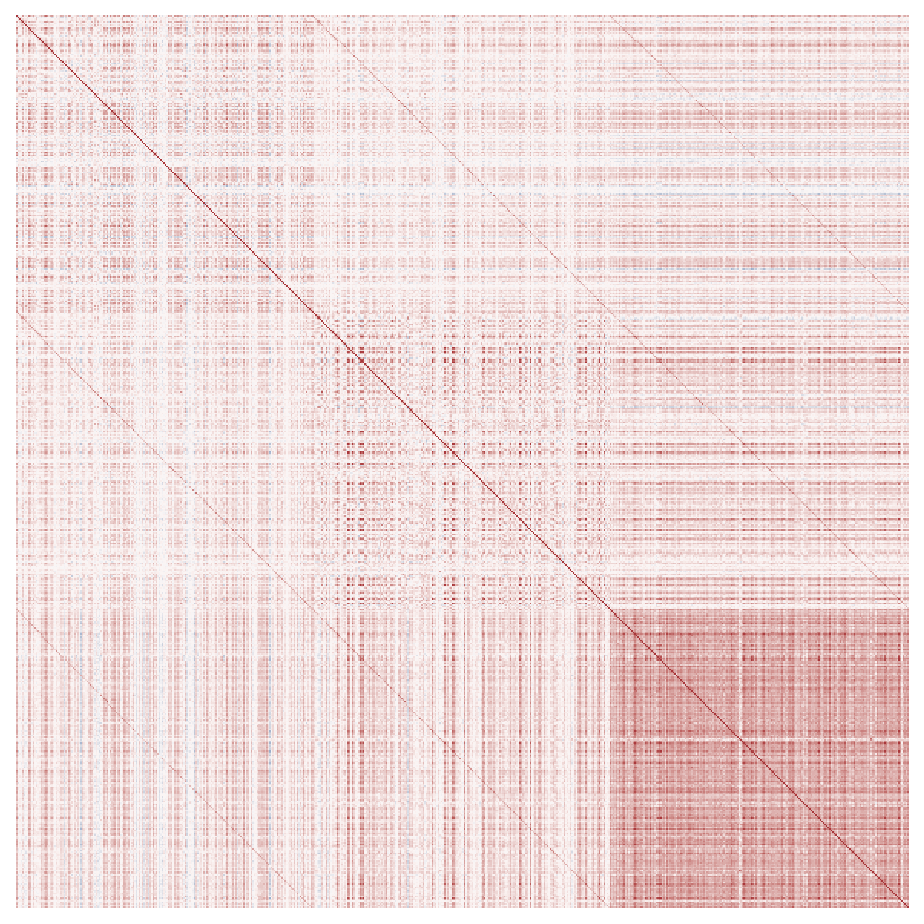

In [18]:
plt.figure(figsize=(6, 6))
genelist = adata_final[adata_final.obs.hdbscan==101].obs.target_contrast_gene_name_corrected.unique().tolist()
corr_mtx = corr_compute(adata_de, genelist)
sns.heatmap(corr_mtx, vmin=-0.7, vmax=0.7, cmap='vlag', cbar=False, xticklabels=False, yticklabels=False)
plt.tight_layout()
plt.savefig('results/cluster101.png')

In [89]:
adata_final[adata_final.obs.hdbscan==25].obs.target_contrast_gene_name_corrected.unique().tolist()

['SLC25A1', 'PDHB', 'MDH2', 'DLAT', 'PDHA1', 'CS', 'ACLY', 'STYXL1']

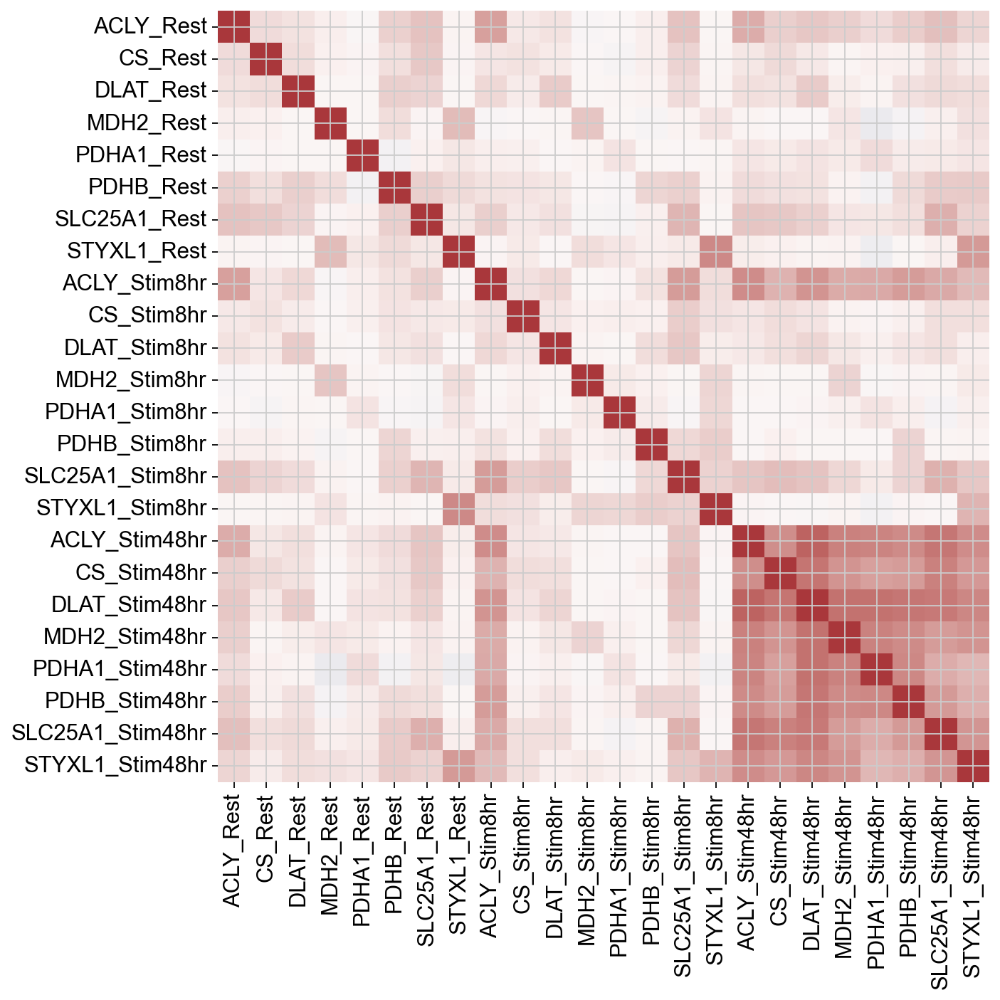

In [85]:
plt.figure(figsize=(9, 9))
genelist = adata_final[adata_final.obs.hdbscan==25].obs.target_contrast_gene_name_corrected.unique().tolist()
corr_mtx = corr_compute(adata_de, genelist)
sns.heatmap(corr_mtx, vmin=-0.7, vmax=0.7, cmap='vlag', cbar=False)
plt.tight_layout()
plt.savefig('results/cluster25.png')

In [103]:
de_summary_stats[de_summary_stats.target_name=='LCK']

,target_contrast,target_name,condition,n_cells_target,n_up_genes,n_down_genes,n_total_de_genes,ontarget_effect_size,ontarget_significant,baseMean,offtarget_flag,n_total_genes_category,ontarget_effect_category,target_contrast_corrected,obs_names,target_name_corrected
2984,ENSG00000182866,LCK,Stim8hr,116.0,1745,669,2414,-8.989515,True,129.013733,False,>10 DE genes,on-target KD,ENSG00000182866,ENSG00000182866_Stim8hr,LCK
21628,ENSG00000182866,LCK,Stim48hr,107.0,613,303,916,-9.689431,True,160.513650,False,>10 DE genes,on-target KD,ENSG00000182866,ENSG00000182866_Stim48hr,LCK
22978,ENSG00000182866,LCK,Rest,102.0,103,206,309,-10.907615,True,205.543259,False,>10 DE genes,on-target KD,ENSG00000182866,ENSG00000182866_Rest,LCK


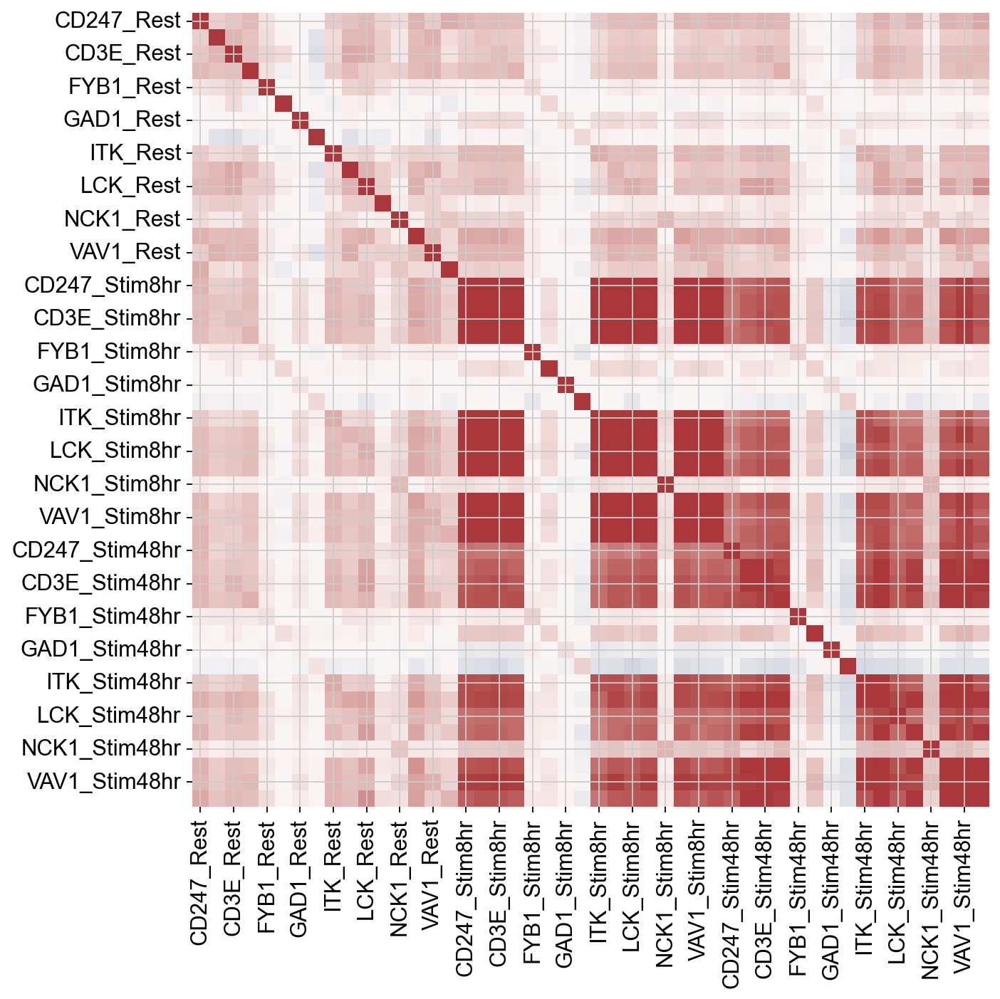

In [105]:
plt.figure(figsize=(9, 9))
genelist = adata_final[(adata_final.obs.hdbscan==29)&(adata_final.obs.target_contrast_gene_name!='BCAT2')&(adata_final.obs.target_contrast_gene_name!='ZBED3')].obs.target_contrast_gene_name_corrected.unique().tolist()
genelist = genelist + ['GRB2', 'GAD1', 'ITK', 'NCK1', 'FYB1', 'FYN', 'LCK']
corr_mtx = corr_compute(adata_de, genelist)
sns.heatmap(corr_mtx, vmin=-0.7, vmax=0.7, cmap='vlag', cbar=False)
plt.tight_layout()
plt.savefig('results/cluster29.png')

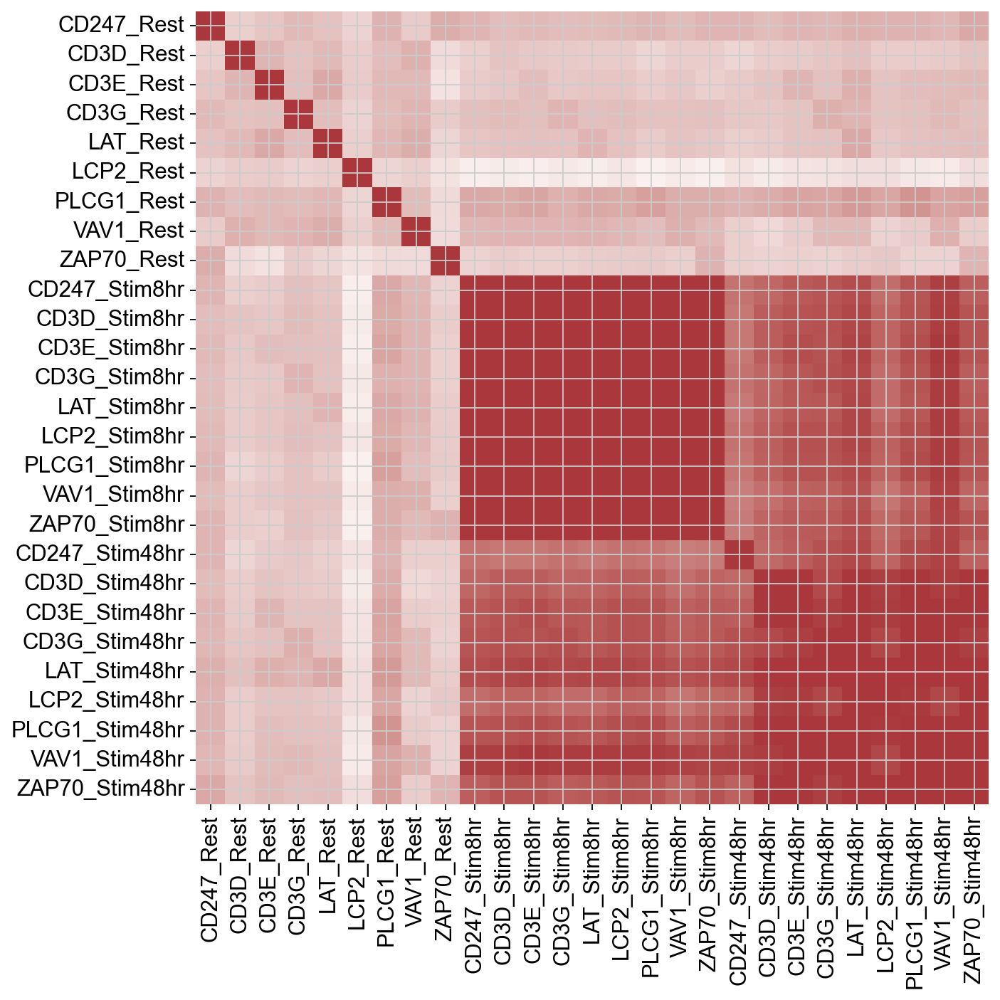

In [106]:
plt.figure(figsize=(9, 9))
genelist = adata_final[(adata_final.obs.hdbscan==29)&(adata_final.obs.target_contrast_gene_name!='BCAT2')&(adata_final.obs.target_contrast_gene_name!='ZBED3')].obs.target_contrast_gene_name_corrected.unique().tolist()
corr_mtx = corr_compute(adata_de, genelist)
sns.heatmap(corr_mtx, vmin=-0.7, vmax=0.7, cmap='vlag', cbar=False)
plt.tight_layout()
plt.savefig('results/cluster29.png')

In [44]:
de_summary_stats[de_summary_stats.target_name=='KDM5']

,target_contrast,target_name,condition,n_cells_target,n_up_genes,n_down_genes,n_total_de_genes,ontarget_effect_size,ontarget_significant,baseMean,offtarget_flag,n_total_genes_category,ontarget_effect_category,target_contrast_corrected,obs_names,target_name_corrected


In [38]:
de_summary_stats[de_summary_stats.target_name=='BDH1']

,target_contrast,target_name,condition,n_cells_target,n_up_genes,n_down_genes,n_total_de_genes,ontarget_effect_size,ontarget_significant,baseMean,offtarget_flag,n_total_genes_category,ontarget_effect_category,target_contrast_corrected,obs_names,target_name_corrected
6623,ENSG00000161267,BDH1,Stim48hr,762.0,0,1,1,-15.532728,True,43.655616,False,1 DE gene,on-target KD,ENSG00000161267,ENSG00000161267_Stim48hr,BDH1
25369,ENSG00000161267,BDH1,Stim8hr,670.0,1,1,2,-12.591295,True,35.456898,False,2-10 DE genes,on-target KD,ENSG00000161267,ENSG00000161267_Stim8hr,BDH1
30701,ENSG00000161267,BDH1,Rest,775.0,0,2,2,-10.268499,True,17.266753,False,2-10 DE genes,on-target KD,ENSG00000161267,ENSG00000161267_Rest,BDH1


In [35]:
adata_de[adata_de.obs.target_contrast_gene_name_corrected=='BDH1']

View of AnnData object with n_obs × n_vars = 3 × 13959
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target', 'target_contrast_corrected', 'target_contrast_gene_name_corrected'
    var: 'gene_ids', 'gene_name'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'

In [34]:
adata_final[adata_final.obs.target_contrast_gene_name_corrected=='BDH1']

View of AnnData object with n_obs × n_vars = 0 × 10799
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target', 'target_contrast_corrected', 'target_contrast_gene_name_corrected', 'hdbscan'
    var: 'gene_ids', 'gene_name'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'

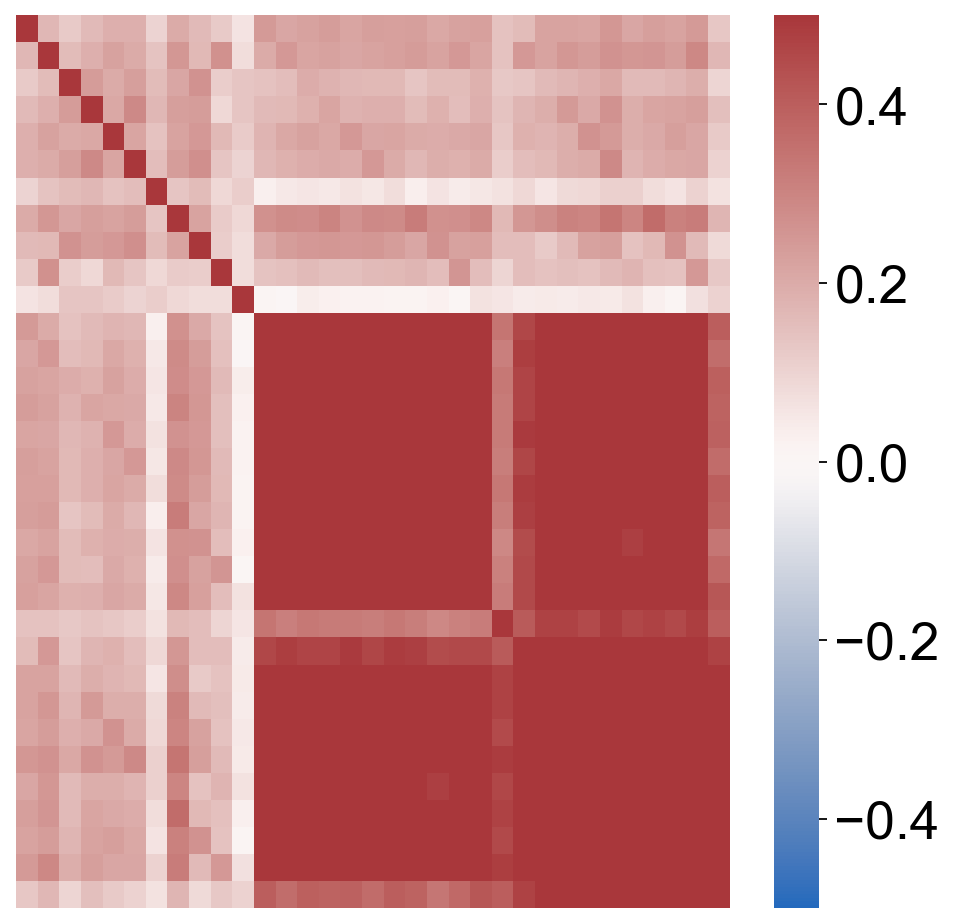

In [32]:
plt.figure(figsize=(6, 6))
genelist = adata_final[adata_final.obs.hdbscan==29].obs.target_contrast_gene_name_corrected.unique().tolist()
corr_mtx = corr_compute(adata_de, genelist)
ax = sns.heatmap(corr_mtx, vmin=-0.5, vmax=0.5, cmap='vlag', xticklabels=False, yticklabels=False, cbar=True)
plt.tight_layout()
cbar = ax.collections[0].colorbar  
cbar.ax.tick_params(labelsize=24)
plt.savefig('results/colorbar0.5.png')

In [37]:
cluster_df[(cluster_df.intracluster_corr<0.2)&(cluster_df.cluster_gene_size>=5)]

,cluster,intracluster_corr,cluster_size,cluster_gene_size,cluster_member
25,25,0.140295,21.0,9.0,"[CDKN2AIP, RBM12, WDR82, UBE3D, DNAAF2, DOP1A,..."
30,30,0.168900,16.0,8.0,"[ZFC3H1, THAP2, GPR137, ZC3H3, GPAA1, ZNF330, ..."
37,37,0.171560,7.0,6.0,"[PIBF1, BCLAF1, C1D, TTC5, FAM161A, STIM1]"
42,42,0.178128,11.0,11.0,"[PDCL, RICTOR, CBFB, POLDIP3, AGRN, EMC4, ZAP7..."
46,46,0.163973,99.0,57.0,"[TMEM131L, ACAD11, DDRGK1, CALR, ALG6, TGDS, D..."
47,47,0.150139,15.0,15.0,"[FLI1, SENP1, ELP6, EMX1, TMEM185A, MBTPS1, TM..."
50,50,0.188514,45.0,44.0,"[KLHDC10, ICOS, NEIL1, PXMP4, ZNF641, HPF1, CA..."
54,54,0.054538,45.0,27.0,"[CNOT11, TSTD2, SETD1B, PCYT2, WAC, CXXC1, KLF..."
58,58,0.184500,6.0,6.0,"[CREBBP, EP300, EME2, CBFB, KDM3B, CDCA3]"
59,59,0.172770,40.0,40.0,"[NIPBL, PXMP4, PDIA3, HSD17B13, ALKBH2, AK3, C..."


In [69]:
adata_final[adata_final.obs.hdbscan==17].obs.sort_values(by='target_contrast_gene_name_corrected')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,target_contrast_corrected,target_contrast_gene_name_corrected,hdbscan
ENSG00000131473_Stim48hr,ACLY,Stim48hr,ENSG00000131473,570,282.0,ENSG00000131473,ACLY,17
ENSG00000131473_Stim8hr,ACLY,Stim8hr,ENSG00000131473,645,396.0,ENSG00000131473,ACLY,17
ENSG00000062485_Stim48hr,CS,Stim48hr,ENSG00000062485,469,232.0,ENSG00000062485,CS,17
ENSG00000150768_Stim48hr,DLAT,Stim48hr,ENSG00000150768,392,372.0,ENSG00000150768,DLAT,17
ENSG00000146701_Stim48hr,MDH2,Stim48hr,ENSG00000146701,182,998.0,ENSG00000146701,MDH2,17
ENSG00000131828_Stim48hr,PDHA1,Stim48hr,ENSG00000131828,454,192.0,ENSG00000131828,PDHA1,17
ENSG00000168291_Stim48hr,PDHB,Stim48hr,ENSG00000168291,155,303.0,ENSG00000168291,PDHB,17
ENSG00000138621_Rest,PPCDC,Rest,ENSG00000138621,198,575.0,ENSG00000138621,PPCDC,17
ENSG00000138621_Stim8hr,PPCDC,Stim8hr,ENSG00000138621,657,599.0,ENSG00000138621,PPCDC,17
ENSG00000127125_Rest,PPCS,Rest,ENSG00000127125,41,137.0,ENSG00000127125,PPCS,17


In [55]:
adata_final[adata_final.obs.hdbscan==40].obs.target_contrast_gene_name_corrected.unique().tolist()

['EDC3', 'LRP2BP', 'CAP1', 'EIF1AX', 'GATA3', 'PPDPF', 'SLC5A6']

In [135]:
adata_final[adata_final.obs.hdbscan==85].obs.target_contrast_gene_name_corrected.tolist()

['KMT2E', 'PKN3', 'TMEM44', 'HS3ST3B1', 'ROBO3', 'DNAJC3', 'MYO9A']

In [633]:
ind1 = np.where(adata.obs.index.isin(['ENSG00000181544_Stim8hr', 'ENSG00000187790_Stim8hr', 'ENSG00000112039_Stim8hr']))[0]
ind2 = np.where(adata.obs.index.isin(['ENSG00000084093_Stim8hr', 'ENSG00000126261_Stim8hr', 'ENSG00000197713_Stim8hr']))[0]
ind3 = np.where(adata.obs.index.isin(['ENSG00000106615_Rest', 'ENSG00000181754_Rest', 'ENSG00000105135_Rest']))[0]
ind = np.concatenate([ind1, ind2, ind3])
ind = np.concatenate([ind1, ind2])

ENSG00000181544_Stim8hr    0.229927
ENSG00000187790_Stim8hr    0.228583
ENSG00000112039_Stim8hr    0.226620
ENSG00000197713_Stim8hr    0.207617
ENSG00000084093_Stim8hr    0.138590
ENSG00000126261_Stim8hr    0.163671
dtype: float64


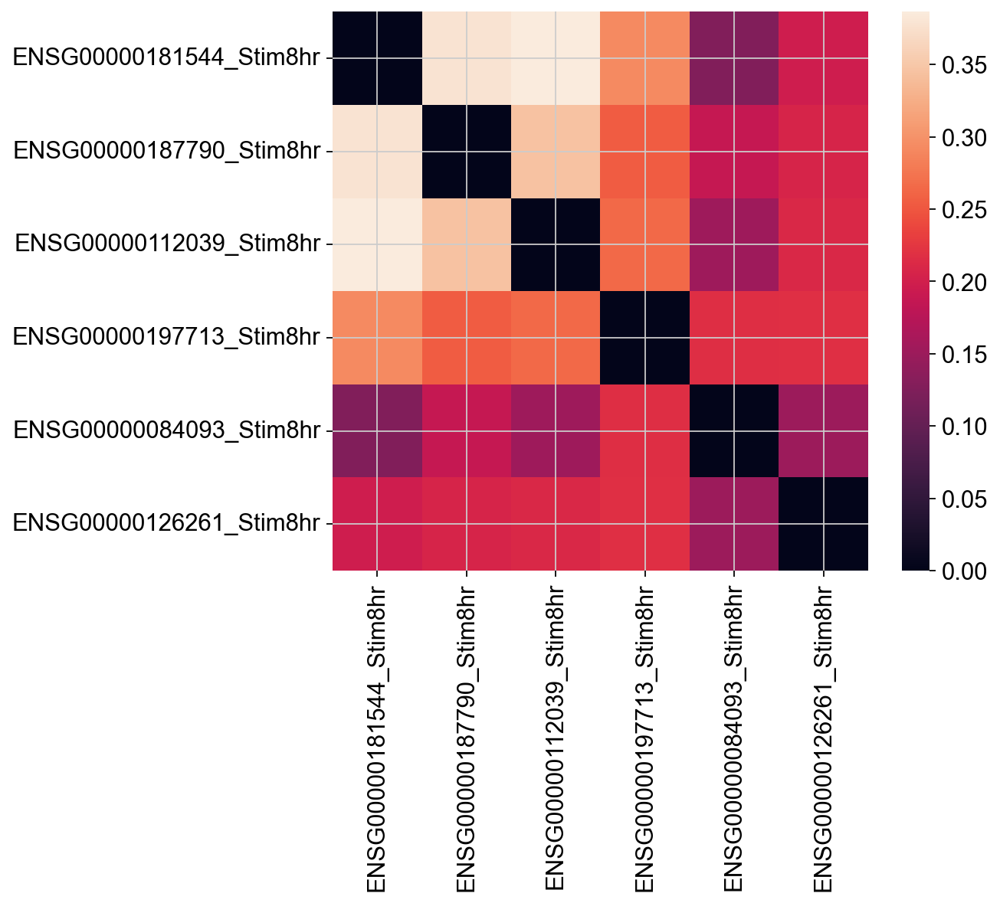

In [634]:
fig, ax = plt.subplots(figsize=(7,6))
test = pd.DataFrame(adata[ind,:].layers['zscore'].copy(),
                    index=adata[ind,:].obs.index,
                    columns=adata.var_names)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, ax=ax)
print(test2.mean())

In [638]:
cluster_df.iloc[196]

cluster                                                            196
correlation                                                   0.132266
cluster_size                                                      51.0
cluster_gene_size                                                 51.0
cluster_member       [XRCC2, STK11, RPE, PRKAR1A, REST, MFN2, SOCS4...
Name: 196, dtype: object

In [639]:
len(test2)

51

In [636]:
np.mean(test2)

0.2190102623292116

target_contrast_gene_name
XRCC2       0.155460
STK11       0.187877
RPE         0.145033
PRKAR1A     0.196557
REST        0.096093
MFN2        0.098684
SOCS4       0.133337
UBE2N       0.156684
UBA2        0.087478
MPP2        0.114244
ARPC1B      0.102885
LIG1        0.171957
NOP53       0.137614
CUL3        0.153088
BBS10       0.142966
RPL29       0.118924
DAXX        0.134098
CCS         0.160383
TIAF1       0.123710
ERCC4       0.173265
TMEM123     0.133618
MYB         0.124566
IPO9        0.109783
CHTF18      0.148957
RNASEH2A    0.107006
IFNGR1      0.082464
AKIRIN2     0.084143
UROS        0.135945
OTUB1       0.161529
UBE2T       0.131997
ZBTB7A      0.105865
SMAP2       0.161909
EIF2AK4     0.083367
TBCA        0.128584
VPS26B      0.148381
PPIL1       0.131701
FBRS        0.102919
OTUD1       0.162664
HOXB2       0.113378
FANCB       0.164285
FANCM       0.164143
ZFYVE21     0.082971
SRSF10      0.125804
SCAF11      0.092112
FANCE       0.156506
TBL1X       0.107938
RPUSD1  

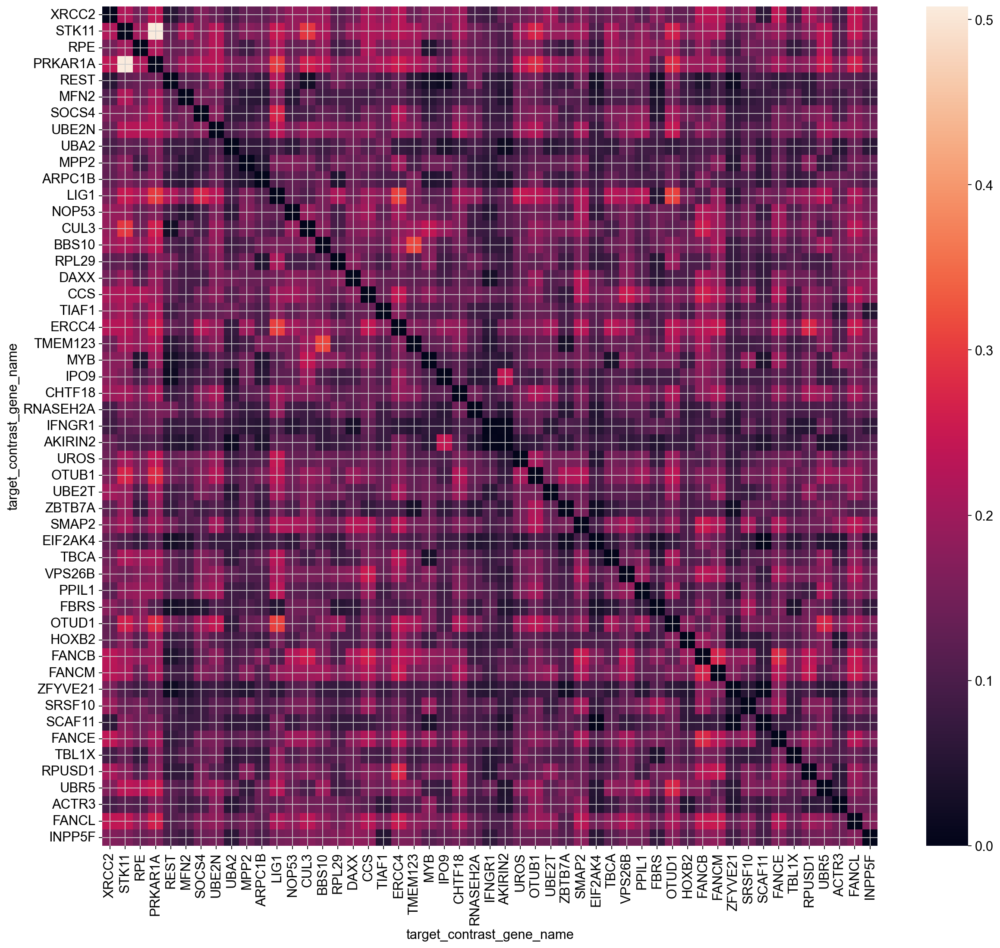

In [641]:
fig, ax = plt.subplots(figsize=(18,16))
test = pd.DataFrame(adata[adata.obs.hdbscan==196].X.copy(),
                    index=adata[adata.obs.hdbscan==196].obs.target_contrast_gene_name,
                    columns=adata.var_names)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, ax=ax)
print(test2.mean())

target_contrast_gene_name
XRCC2       0.251993
STK11       0.276370
RPE         0.239903
PRKAR1A     0.286010
REST        0.170421
MFN2        0.181922
SOCS4       0.220954
UBE2N       0.235484
UBA2        0.165897
MPP2        0.194984
ARPC1B      0.196420
LIG1        0.260427
NOP53       0.233821
CUL3        0.228241
BBS10       0.249525
RPL29       0.195119
DAXX        0.205384
CCS         0.258144
TIAF1       0.219291
ERCC4       0.263898
TMEM123     0.213682
MYB         0.206153
IPO9        0.186391
CHTF18      0.238871
RNASEH2A    0.188368
IFNGR1      0.167099
AKIRIN2     0.156660
UROS        0.234154
OTUB1       0.253307
UBE2T       0.211350
ZBTB7A      0.192541
SMAP2       0.251400
EIF2AK4     0.160848
TBCA        0.216539
VPS26B      0.248698
PPIL1       0.215955
FBRS        0.187264
OTUD1       0.252743
HOXB2       0.195839
FANCB       0.260649
FANCM       0.266563
ZFYVE21     0.168401
SRSF10      0.199740
SCAF11      0.173715
FANCE       0.252348
TBL1X       0.189730
RPUSD1  

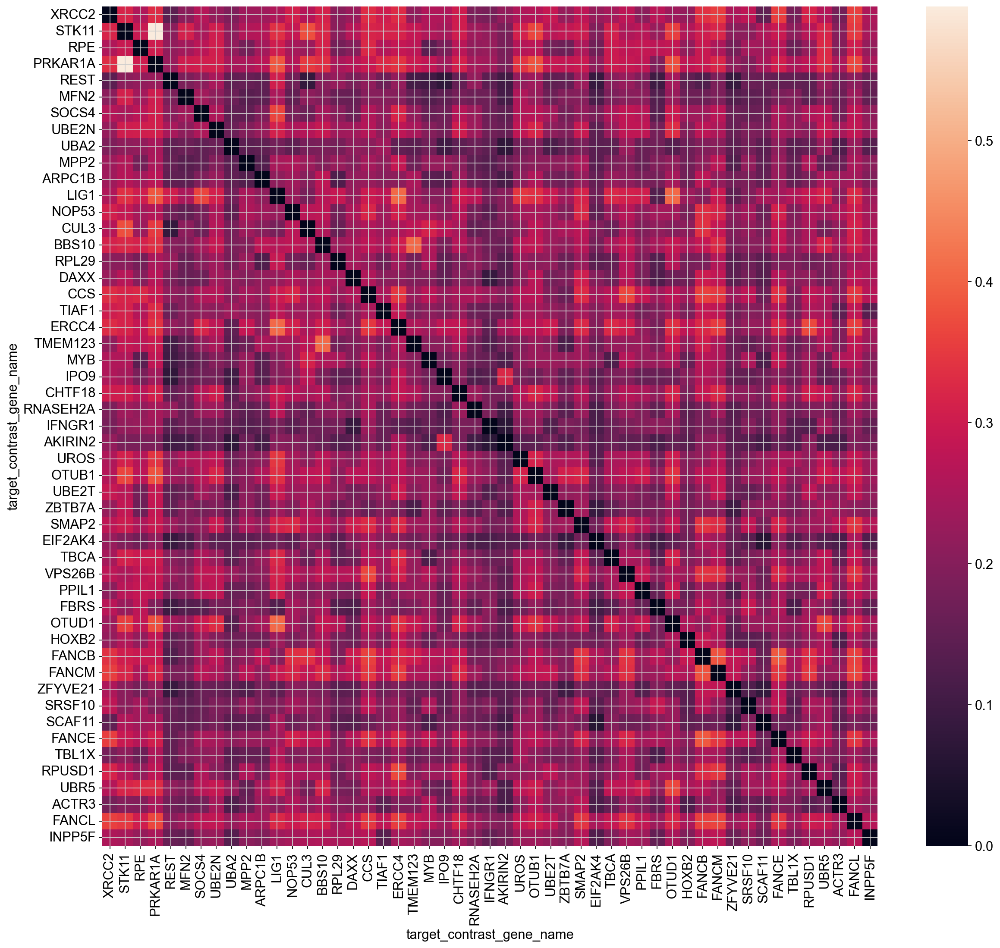

In [635]:
fig, ax = plt.subplots(figsize=(18,16))
test = pd.DataFrame(adata[adata.obs.hdbscan==196].layers['zscore'].copy(),
                    index=adata[adata.obs.hdbscan==196].obs.target_contrast_gene_name,
                    columns=adata.var_names)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, ax=ax)
print(test2.mean())

In [562]:
cluster_df.iloc[196]

cluster                                                            196
correlation                                                   0.132266
cluster_size                                                      51.0
cluster_gene_size                                                 51.0
cluster_member       [XRCC2, STK11, RPE, PRKAR1A, REST, MFN2, SOCS4...
Name: 196, dtype: object

In [600]:
adata[adata.obs.hdbscan==196].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden,hierarchical,hdbscan
ENSG00000196584_Stim8hr,XRCC2,Stim8hr,ENSG00000196584,10,159.0,6,36,196
ENSG00000118046_Stim8hr,STK11,Stim8hr,ENSG00000118046,46,218.0,6,36,196
ENSG00000197713_Stim8hr,RPE,Stim8hr,ENSG00000197713,124,336.0,6,36,196
ENSG00000108946_Stim8hr,PRKAR1A,Stim8hr,ENSG00000108946,141,94.0,6,36,196
ENSG00000084093_Stim8hr,REST,Stim8hr,ENSG00000084093,146,91.0,6,36,196
ENSG00000116688_Stim8hr,MFN2,Stim8hr,ENSG00000116688,177,157.0,6,36,196
ENSG00000180008_Stim8hr,SOCS4,Stim8hr,ENSG00000180008,204,269.0,6,36,196
ENSG00000177889_Stim8hr,UBE2N,Stim8hr,ENSG00000177889,208,107.0,6,36,196
ENSG00000126261_Stim8hr,UBA2,Stim8hr,ENSG00000126261,219,77.0,6,36,196
ENSG00000108852_Stim8hr,MPP2,Stim8hr,ENSG00000108852,240,202.0,6,36,196


In [565]:
cluster_df[(cluster_df.correlation>0.1)&(cluster_df.correlation<=0.15)]

,cluster,correlation,cluster_size,cluster_gene_size,cluster_member
13,13,0.123188,7.0,3.0,"[CLASRP, CFAP20, C7orf55-LUC7L2]"
17,17,0.122135,9.0,5.0,"[KLHDC10, KDM2A, KMT2B, UBFD1, RAB2B]"
24,24,0.107716,7.0,5.0,"[NCOR1, C11orf68, CCNA2, HDAC3, RELL2]"
25,25,0.103608,12.0,7.0,"[MCTS1, DENR, GABPB1, BORCS8-MEF2B, CARNMT1, K..."
32,32,0.123476,5.0,3.0,"[PIGB, GPR137, PDIA3]"
39,39,0.108427,18.0,9.0,"[ZNF200, TENT5C, PCGF1, FAM208B, KDM5C, PCGF6,..."
45,45,0.138748,22.0,8.0,"[CDKN2AIP, RBM12, RPRD1B, UBE3D, WDR82, DNAAF2..."
50,50,0.137574,46.0,45.0,"[SMS, CNBP, NOP53, TRRAP, TSC22D2, ZNF607, ERF..."
66,66,0.134603,6.0,6.0,"[UBE2V2, STAT1, ZC3H12A, ZBTB21, MUS81, USF2]"
87,87,0.124352,11.0,11.0,"[CMTM7, LUZP6, GYPC, ERGIC3, FBXO32, DOP1B, CD..."


In [601]:
clustering_temp = clustering_summary

In [607]:
cluster1 = []
cluster2 = []
cluster_size = []
for i in range(len(clustering_temp)):
    cluster1.append(clustering_temp.loc[i, 'leiden_assignment'][ind1].tolist())
    cluster2.append(clustering_temp.loc[i, 'leiden_assignment'][ind2].tolist())
    cluster_temp = clustering_temp.loc[i, 'leiden_assignment'][ind1].tolist()[0]
    cluster_size.append(np.sum(clustering_temp.loc[i, 'leiden_assignment']==cluster_temp))
clustering_temp['cluster1'] = cluster1
clustering_temp['cluster2'] = cluster2
clustering_temp['FANCE_cluster_size'] = cluster_size

In [608]:
clustering_temp

,n_comp,n_neighbor,resolution,sil_score_raw,sil_score_pca,ch_score_raw,ch_score_pca,db_score_raw,db_score_pca,leiden_assignment,cluster1,cluster2,FANCE_cluster_size
0,75,15,2,0.016427,0.058987,22.958467,74.534779,4.435003,2.425253,"[8, 4, 20, 5, 2, 24, 7, 15, 7, 11, 13, 13, 21,...","[2, 2, 2]","[2, 2, 2]",277
1,75,15,3,0.011220,0.048698,18.423818,61.241145,4.489873,2.527932,"[6, 4, 32, 9, 3, 35, 5, 12, 5, 11, 23, 14, 17,...","[3, 3, 3]","[3, 3, 3]",220
2,75,15,4,0.008050,0.034090,15.956902,53.281551,4.475143,2.511294,"[43, 22, 34, 34, 9, 46, 1, 15, 1, 5, 35, 11, 3...","[9, 9, 9]","[9, 9, 9]",126
3,75,31,2,0.015017,0.051422,24.650208,77.349527,4.382809,2.379830,"[9, 3, 18, 18, 4, 19, 11, 14, 11, 6, 8, 8, 8, ...","[4, 4, 4]","[4, 4, 4]",319
4,75,31,3,0.014618,0.054336,21.010581,69.848063,4.568584,2.516332,"[5, 26, 23, 23, 4, 31, 7, 16, 7, 6, 37, 26, 14...","[4, 4, 4]","[4, 4, 4]",206
5,75,31,4,0.010993,0.045087,18.149377,61.555573,4.572742,2.514009,"[40, 23, 34, 34, 7, 32, 3, 13, 3, 4, 44, 14, 2...","[7, 7, 7]","[7, 7, 7]",163
6,75,63,2,0.013317,0.052116,28.603754,90.312897,4.508228,2.432423,"[7, 2, 17, 17, 3, 20, 11, 14, 11, 6, 13, 13, 9...","[3, 3, 3]","[3, 3, 3]",333
7,75,63,3,0.009088,0.036808,21.538062,69.695707,4.638048,2.506608,"[6, 16, 18, 18, 2, 27, 8, 14, 8, 7, 19, 19, 22...","[2, 2, 2]","[2, 2, 2]",252
8,75,63,4,0.010214,0.036046,19.760796,66.626909,4.680761,2.564799,"[6, 15, 28, 28, 5, 36, 7, 14, 7, 4, 18, 22, 34...","[5, 5, 5]","[5, 5, 5]",192
9,100,15,2,0.011034,0.045614,22.147139,66.326297,4.366449,2.502863,"[9, 3, 17, 6, 1, 24, 8, 14, 8, 5, 10, 10, 18, ...","[1, 1, 1]","[1, 1, 1]",335
